In [2]:
import numpy as np
import healpy as hp

import matplotlib
from matplotlib import pyplot as plt

from scipy import stats
import matplotlib.gridspec as gridspec
import astropy.cosmology.units as cu
import astropy.units as u
import site
site.addsitedir('/oak/stanford/orgs/kipac/users/mahlet/quaia_bias/scripts') 
import quaia
import seaborn as sns
from matplotlib.colors import LogNorm
import matplotlib.patches as mpatches
import pyccl as ccl
from matplotlib.lines import Line2D
from matplotlib import cm
from scipy.optimize import minimize
from astropy.cosmology import Planck18
from dynesty import NestedSampler
from dynesty import plotting as dyplot
from dynesty import utils as dyfunc
from astropy.coordinates import SkyCoord
from scipy import linalg
from scipy.special import gamma
from healpy.newvisufunc import projview
from scipy import special

In [3]:
matplotlib.rcParams['ytick.labelsize'] = 18
matplotlib.rcParams['xtick.labelsize'] = 18
matplotlib.rcParams['axes.labelsize'] = 22
matplotlib.rcParams['legend.fontsize'] = 18
matplotlib.rcParams['axes.titlesize'] = 20

# G20.5
## Define parameters

In [4]:
G_hi = 20.5
G_lo = 20.0

In [5]:
z_bins = np.array([0.0, 1.0, 2.0, 3.0, 4.6])
z_array = range(len(z_bins)-1)
mask = 0.5

In [6]:
L_array = np.array([-32, -27, -26, -25, -20], dtype = float)[::-1]

In [7]:
L_bins = L_array[::-1][:0:-1]
L_bins

array([-20., -25., -26., -27.])

# Visualize the luminosity threshold cuts and redshift bins

In [8]:
zsplit=4
Lsplit=4

In [10]:
cmap_red = plt.get_cmap('Reds')(np.linspace(0.333, 0.999, len(L_bins)))
cmap_orange = plt.get_cmap('Oranges')(np.linspace(0.333, 0.999, len(L_bins)))
cmap_green = plt.get_cmap('Greens')(np.linspace(0.333, 0.999, len(L_bins)))
cmap_blue = plt.get_cmap('Blues')(np.linspace(0.333, 0.999, len(z_array)))
colors = ['Red', 'Orange', 'Green', 'Blue']

<>:45: SyntaxWarning: invalid escape sequence '\m'
<>:52: SyntaxWarning: invalid escape sequence '\m'
<>:45: SyntaxWarning: invalid escape sequence '\m'
<>:52: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_22359/4127433845.py:45: SyntaxWarning: invalid escape sequence '\m'
  ax2.set_ylabel('$N_\mathrm{QSO}$')
/tmp/ipykernel_22359/4127433845.py:52: SyntaxWarning: invalid escape sequence '\m'
  ax3.set_xlabel('$N_\mathrm{QSO}$')


Pixels masked by MC but not already by selfunc: 907
G20.5_zsplit4bin0_Lsplit4bin0: 0.01              80042 vs 80949
Pixels masked by MC but not already by selfunc: 798
G20.5_zsplit4bin0_Lsplit4bin1: 0.01              80150 vs 80948
Pixels masked by MC but not already by selfunc: 780
G20.5_zsplit4bin0_Lsplit4bin2: 0.01              80169 vs 80949
Pixels masked by MC but not already by selfunc: 706
G20.5_zsplit4bin0_Lsplit4bin3: 0.01              80243 vs 80949
Pixels masked by MC but not already by selfunc: 855
G20.5_zsplit4bin1_Lsplit4bin0: 0.01              80132 vs 80987
Pixels masked by MC but not already by selfunc: 819
G20.5_zsplit4bin1_Lsplit4bin1: 0.01              80168 vs 80987
Pixels masked by MC but not already by selfunc: 801
G20.5_zsplit4bin1_Lsplit4bin2: 0.01              80186 vs 80987
Pixels masked by MC but not already by selfunc: 620
G20.5_zsplit4bin1_Lsplit4bin3: 0.01              80368 vs 80988
Pixels masked by MC but not already by selfunc: 918
G20.5_zsplit4bin2_Ls

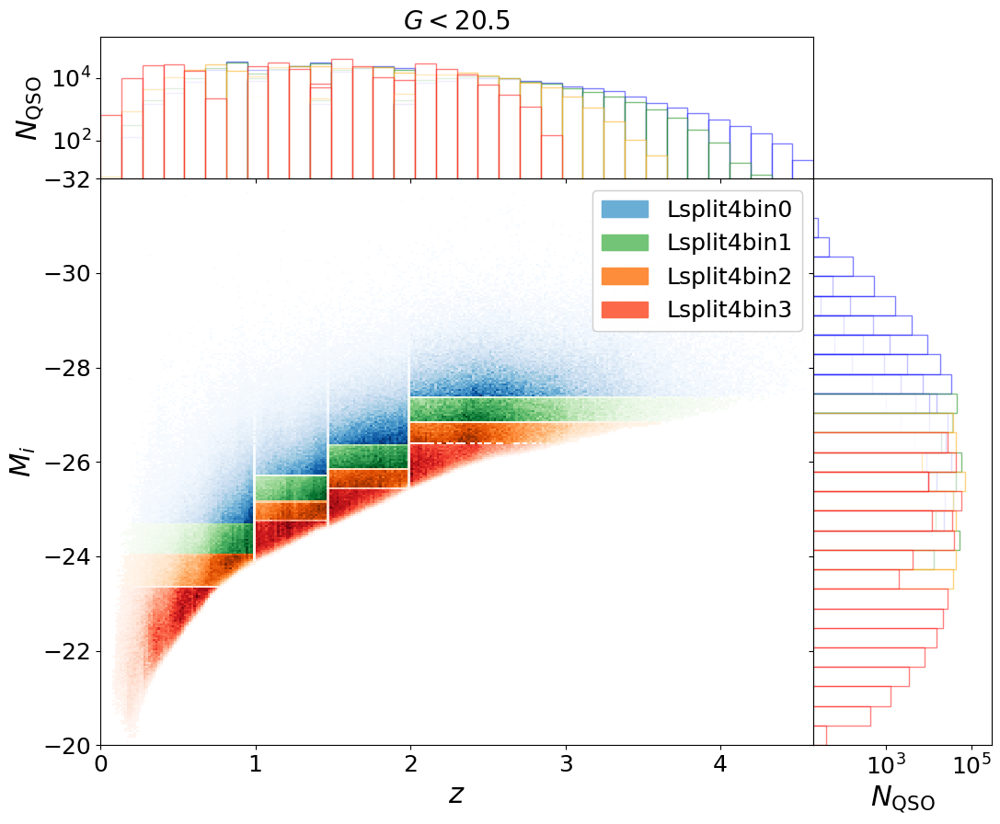

In [159]:
# plot!
fig = plt.figure(figsize = (12.5, 10))
gs = gridspec.GridSpec(2, 2, hspace = 0, height_ratios=[1,4], width_ratios=[4,1], wspace = 0)
fac_rand = 25

ax1 = fig.add_subplot(gs[2])
ax2 = fig.add_subplot(gs[0])
ax3 = fig.add_subplot(gs[3])

N_q = []

for i in range(zsplit):

    N_q_z = []
    for j in range(Lsplit):
        
        tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, _, _, _ = quaia.make_bins(G_hi, [i, j], True, ['z', 'L'], 
                                                                                             n_bins = [zsplit, Lsplit], tab_gcat_type = 'data', 
                                                                                              method = ['split', 'split'], fac_rand = fac_rand, 
                                                                                              mask_type = 'b', bins = [None, None])
        try:
            
            quaia.absolute(tab_datahi_mask_zbin0, G_hi)
            h1, xedges, yedges, image = ax1.hist2d(tab_datahi_mask_zbin0['redshift_quaia'], tab_datahi_mask_zbin0['M_i'],
                                                   cmap = plt.get_cmap('{}s'.format(colors[::-1][j])), bins = [np.linspace(0, 4.6, 300), np.linspace(-32, -20, 300)],
                                                   cmin = 1)
            xlim = ax1.get_xlim()

            ax2.hist(tab_datahi_mask_zbin0['redshift_quaia'], color = 'white', edgecolor = colors[::-1][j], bins = np.linspace(0, 4.6, 35), alpha = 0.5)
            ax3.hist(tab_datahi_mask_zbin0['M_i'], color = 'white', edgecolor = colors[::-1][j], orientation = 'horizontal', bins = np.linspace(-32, -20, 30), alpha = 0.5, label = 'Lsplit{}bin{}'.format(Lsplit, j))


        except Exception as e:

            print(len(tab_randhi_mask_zbin0))
            print(e)
        
        N_q_z.append(len(tab_datahi_mask_zbin0))
    N_q.append(N_q_z)
    
ax1.set_ylabel('$M_i$')
ax1.set_xlabel('$z$')
ax1.set_ylim(-20, -32)

ax2.set_ylabel('$N_\mathrm{QSO}$')
ax2.set_yscale('log')
ax2.set_xlim(xlim)
ax2.set_ylim(6,2e5)
ax2.set_xticklabels([])
ax2.set_title('$G<{}$'.format(G_hi))

ax3.set_xlabel('$N_\mathrm{QSO}$')
ax3.set_xscale('log')
ax3.set_yticklabels([])
ax3.set_ylim(-20, -32)
ax3.set_xlim(2e1,3e5)

custom_lines = [mpatches.Patch(color=plt.get_cmap('{}s'.format(colors[::-1][i]))(np.array(0.5))) for i in range(Lsplit)]
second_legend = ax1.legend(custom_lines, ['Lsplit{}bin{}'.format(Lsplit, j) for j in range(Lsplit)])
fig.add_artist(second_legend)

plt.show()

<>:45: SyntaxWarning: invalid escape sequence '\m'
<>:52: SyntaxWarning: invalid escape sequence '\m'
<>:45: SyntaxWarning: invalid escape sequence '\m'
<>:52: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_22359/173808288.py:45: SyntaxWarning: invalid escape sequence '\m'
  ax2.set_ylabel('$N_\mathrm{QSO}$')
/tmp/ipykernel_22359/173808288.py:52: SyntaxWarning: invalid escape sequence '\m'
  ax3.set_xlabel('$N_\mathrm{QSO}$')


Pixels masked by MC but not already by selfunc: 3191
G20.5_zsplit4bin0_Lmaxsplit4bin3: 0.01              320604 vs 323795
Pixels masked by MC but not already by selfunc: 2485
G20.5_zsplit4bin0_Lmaxsplit4bin2: 0.01              240361 vs 242846
Pixels masked by MC but not already by selfunc: 1705
G20.5_zsplit4bin0_Lmaxsplit4bin1: 0.01              160192 vs 161897
Pixels masked by MC but not already by selfunc: 907
G20.5_zsplit4bin0_Lmaxsplit4bin0: 0.01              80042 vs 80949
Pixels masked by MC but not already by selfunc: 3095
G20.5_zsplit4bin1_Lmaxsplit4bin3: 0.01              320854 vs 323949
Pixels masked by MC but not already by selfunc: 2475
G20.5_zsplit4bin1_Lmaxsplit4bin2: 0.01              240486 vs 242961
Pixels masked by MC but not already by selfunc: 1674
G20.5_zsplit4bin1_Lmaxsplit4bin1: 0.01              160300 vs 161974
Pixels masked by MC but not already by selfunc: 855
G20.5_zsplit4bin1_Lmaxsplit4bin0: 0.01              80132 vs 80987
Pixels masked by MC but not al

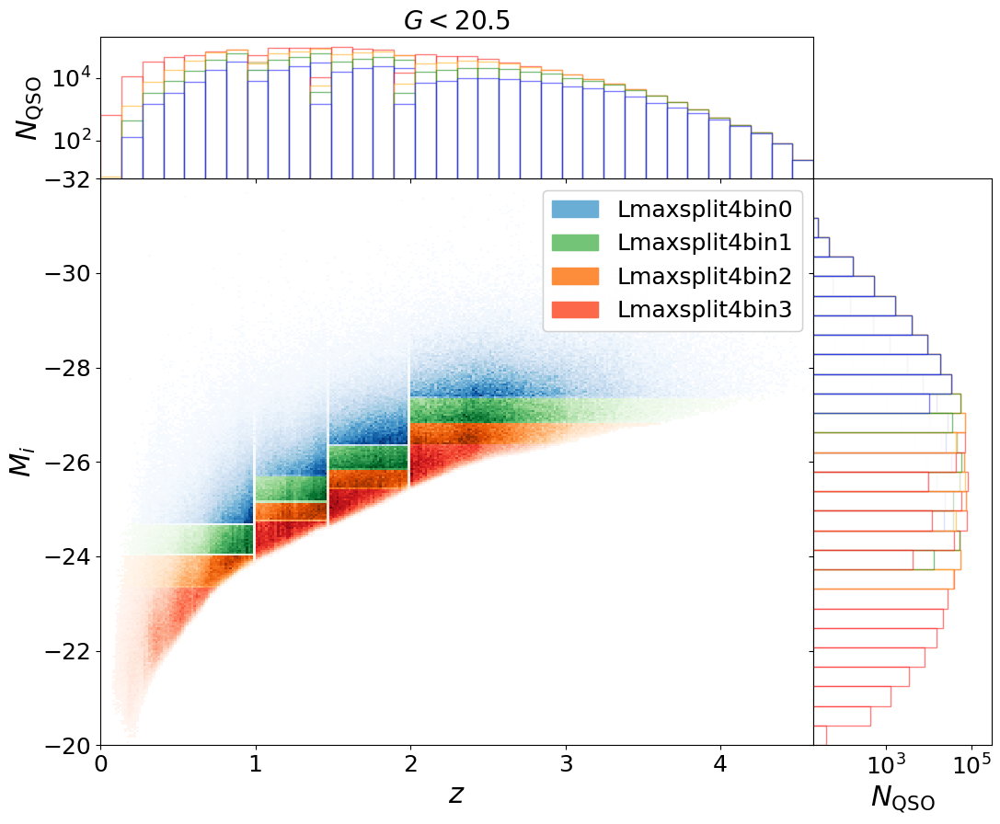

In [163]:
# plot!
fig = plt.figure(figsize = (12.5, 10))
gs = gridspec.GridSpec(2, 2, hspace = 0, height_ratios=[1,4], width_ratios=[4,1], wspace = 0)
fac_rand = 25

ax1 = fig.add_subplot(gs[2])
ax2 = fig.add_subplot(gs[0])
ax3 = fig.add_subplot(gs[3])

N_q = []

for i in range(zsplit):

    N_q_z = []
    for j in reversed(range(Lsplit)):

        tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, _, _, _ = quaia.make_bins(G_hi, [i, j], True, ['z', 'L'], 
                                                                                             n_bins = [zsplit, Lsplit], tab_gcat_type = 'data', 
                                                                                              method = ['split', 'maxsplit'], fac_rand = fac_rand, 
                                                                                              mask_type = 'b', bins = [None, None])
        try:
            
            quaia.absolute(tab_datahi_mask_zbin0, G_hi)
            h1, xedges, yedges, image = ax1.hist2d(tab_datahi_mask_zbin0['redshift_quaia'], tab_datahi_mask_zbin0['M_i'],
                                                   cmap = plt.get_cmap('{}s'.format(colors[::-1][j])), bins = [np.linspace(0, 4.6, 300), np.linspace(-32, -20, 300)],
                                                   cmin = 1)
            xlim = ax1.get_xlim()

            ax2.hist(tab_datahi_mask_zbin0['redshift_quaia'], color = 'white', edgecolor = colors[::-1][j], bins = np.linspace(0, 4.6, 35), alpha = 0.5)
            ax3.hist(tab_datahi_mask_zbin0['M_i'], color = 'white', edgecolor = colors[::-1][j], orientation = 'horizontal', bins = np.linspace(-32, -20, 30), alpha = 0.5, label = 'Lsplit{}bin{}'.format(Lsplit, j))


        except Exception as e:

            print(len(tab_randhi_mask_zbin0))
            print(e)
        
        N_q_z.append(len(tab_datahi_mask_zbin0))
    N_q.append(N_q_z)
    
ax1.set_ylabel('$M_i$')
ax1.set_xlabel('$z$')
ax1.set_ylim(-20, -32)

ax2.set_ylabel('$N_\mathrm{QSO}$')
ax2.set_yscale('log')
ax2.set_xlim(xlim)
ax2.set_ylim(6,2e5)
ax2.set_xticklabels([])
ax2.set_title('$G<{}$'.format(G_hi))

ax3.set_xlabel('$N_\mathrm{QSO}$')
ax3.set_xscale('log')
ax3.set_yticklabels([])
ax3.set_ylim(-20, -32)
ax3.set_xlim(2e1,3e5)

custom_lines = [mpatches.Patch(color=plt.get_cmap('{}s'.format(colors[::-1][i]))(np.array(0.5))) for i in range(Lsplit)]
second_legend = ax1.legend(custom_lines, ['Lmaxsplit{}bin{}'.format(Lsplit, j) for j in range(Lsplit)])
fig.add_artist(second_legend)

plt.show()

## Visualize skymaps

In [204]:
NSIDE = 64
NPIX = hp.nside2npix(NSIDE)
name_catalog = '$Gaia$-$unWISE$ Quasar Catalog'

In [207]:
cmap_map = 'plasma'
cbar_ticks = [5, 10, 20]

In [224]:
LMC = SkyCoord(['05 23 34.6 -69 45 22'], unit=(u.hourangle, u.deg)) #https://simbad.u-strasbg.fr/simbad/sim-id?Ident=Large+Magellanic+Cloud

In [225]:
LMC_radius = 9*u.deg

In [226]:
SMC = SkyCoord(['00 52 38.0 -72 48 01'], unit=(u.hourangle, u.deg)) # https://simbad.u-strasbg.fr/simbad/sim-id?Ident=small+Magellanic+Cloud

In [227]:
SMC_radius = 5*u.deg

In [228]:
theta, phi = hp.pix2ang(NSIDE, range(NPIX), lonlat=True)
c = SkyCoord(ra=theta*u.degree, dec=phi*u.degree)
LMC_idx, _, _, _ = SkyCoord.search_around_sky(LMC, c, LMC_radius)
SMC_idx, _, _, _ = SkyCoord.search_around_sky(SMC, c, SMC_radius)
MC_idx = np.append(LMC_idx,SMC_idx)
MC_mask = np.full_like(range(NPIX), True, dtype = bool)
MC_mask[MC_idx] = False

In [231]:
selfunc_mask = np.abs(c.galactic.b.value)>=0

Pixels masked by MC but not already by selfunc: 908
G20.5_zmin0.0zmax1.0_Lmaxsplit4bin0: 0.01              80176 vs 81084
1.410061347372457 1.8523084442942095
Pixels masked by MC but not already by selfunc: 1703
G20.5_zmin0.0zmax1.0_Lmaxsplit4bin1: 0.01              160465 vs 162168
2.9106448964944995 3.6186926686096674
Pixels masked by MC but not already by selfunc: 2488
G20.5_zmin0.0zmax1.0_Lmaxsplit4bin2: 0.01              240764 vs 243252
4.4016367551746 5.395075484408734
Pixels masked by MC but not already by selfunc: 3194
G20.5_zmin0.0zmax1.0_Lmaxsplit4bin3: 0.01              321142 vs 324336
5.883710929512365 7.1835905027793014
Pixels masked by MC but not already by selfunc: 1790
G20.5_zmin1.0zmax2.0_Lmaxsplit4bin0: 0.01              160259 vs 162049
2.900416300616179 3.620539103029654
Pixels masked by MC but not already by selfunc: 3415
G20.5_zmin1.0zmax2.0_Lmaxsplit4bin1: 0.01              320683 vs 324098
5.900246282079186 7.14837839239998
Pixels masked by MC but not already 

/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/healpy/newvisufunc.py:456: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(


Pixels masked by MC but not already by selfunc: 3576
G20.5_zmin2.0zmax3.0_Lmaxsplit4bin3: 0.01              282932 vs 286508
5.105751412490065 6.406781139593269
Pixels masked by MC but not already by selfunc: 112
G20.5_zmin3.0zmax4.6_Lmaxsplit4bin0: 0.01              9003 vs 9115
0.11706211658443329 0.24927089122806673
Pixels masked by MC but not already by selfunc: 221
G20.5_zmin3.0zmax4.6_Lmaxsplit4bin1: 0.01              18008 vs 18229
0.26990828089019675 0.4628391149431366
Pixels masked by MC but not already by selfunc: 313
G20.5_zmin3.0zmax4.6_Lmaxsplit4bin2: 0.01              27030 vs 27343
0.427031613758575 0.672821901866425
Pixels masked by MC but not already by selfunc: 386
G20.5_zmin3.0zmax4.6_Lmaxsplit4bin3: 0.01              36072 vs 36458
0.5841780810059747 0.8835953564940253


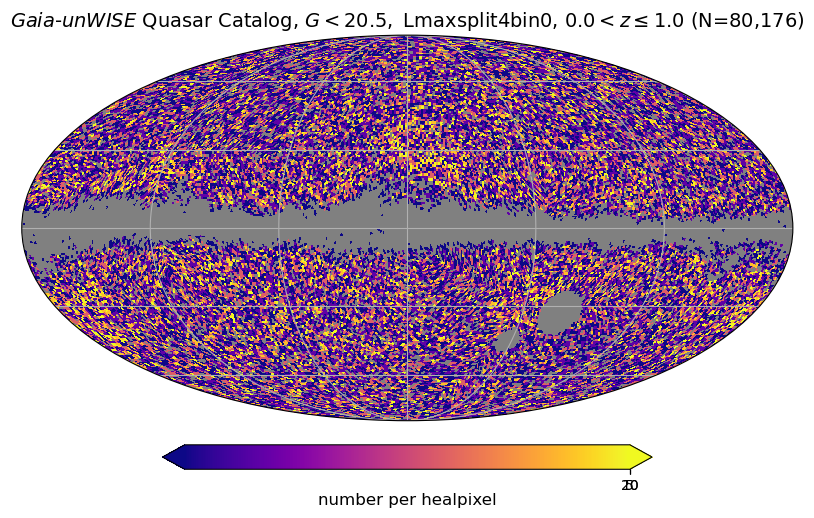

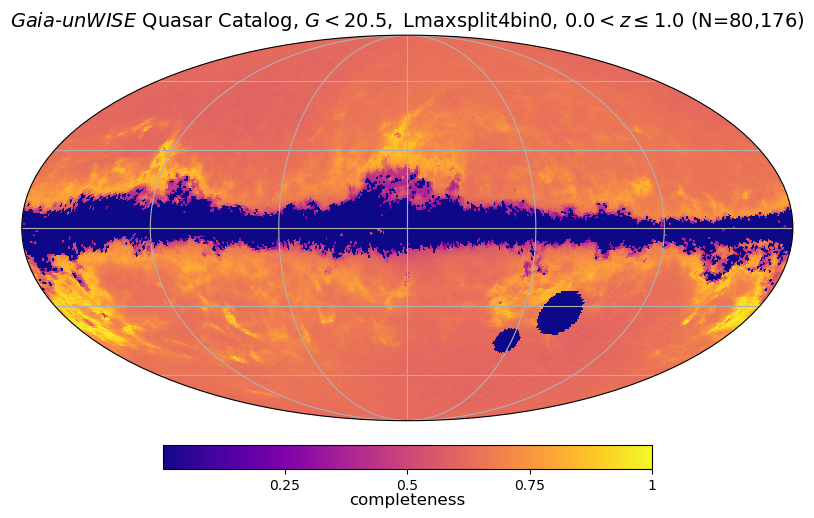

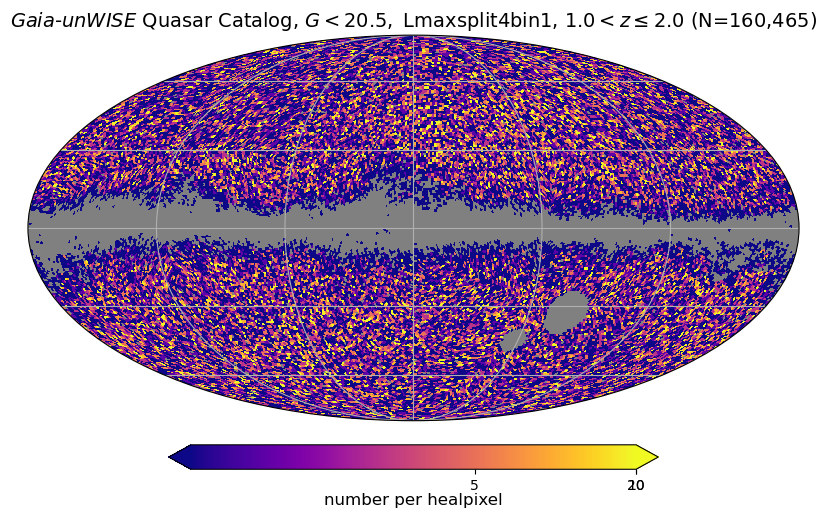

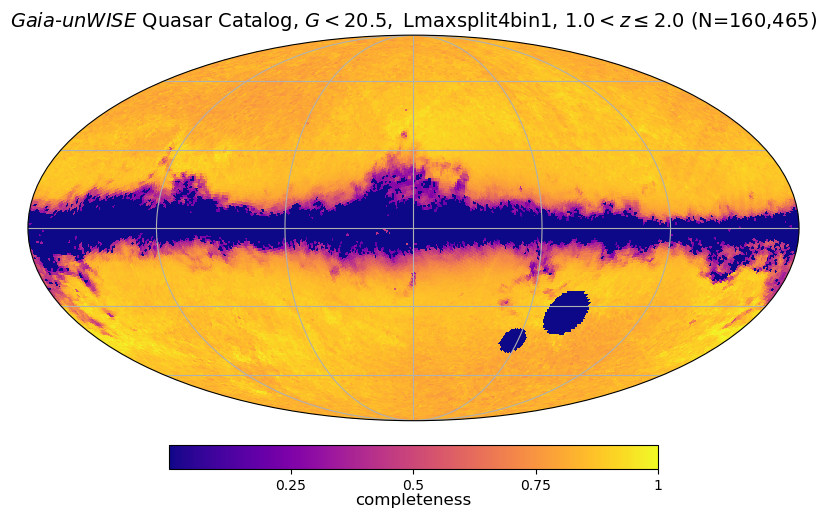

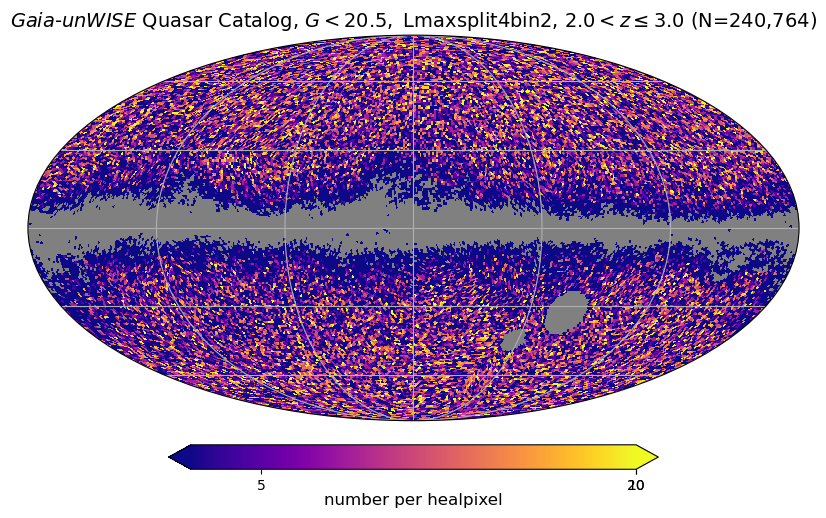

...

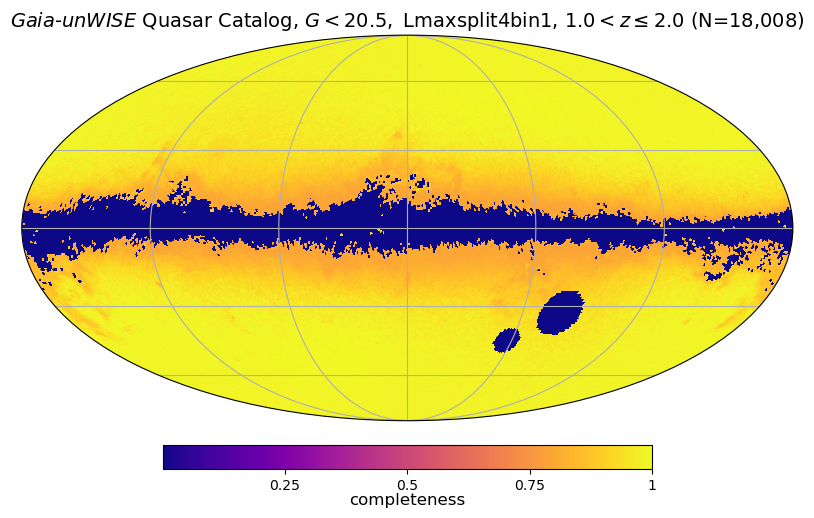

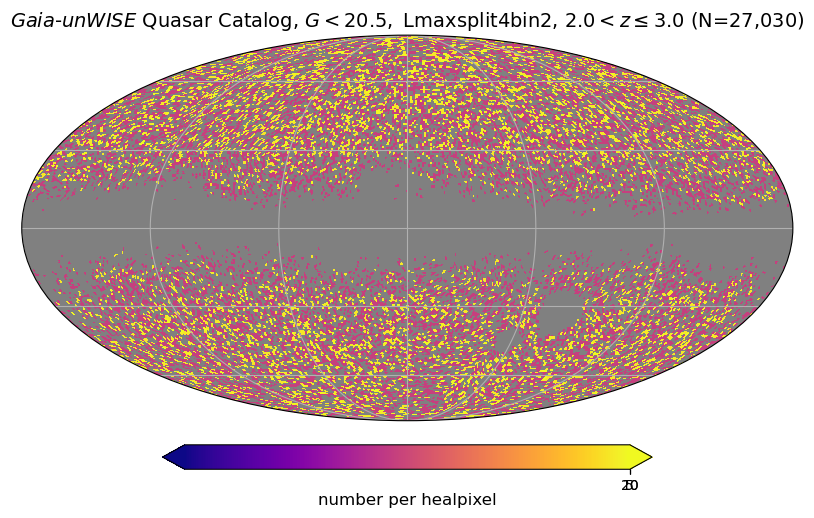

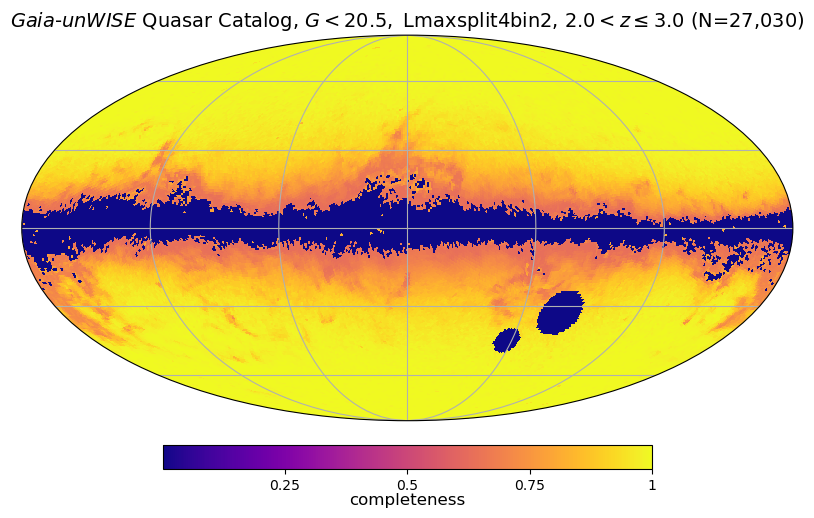

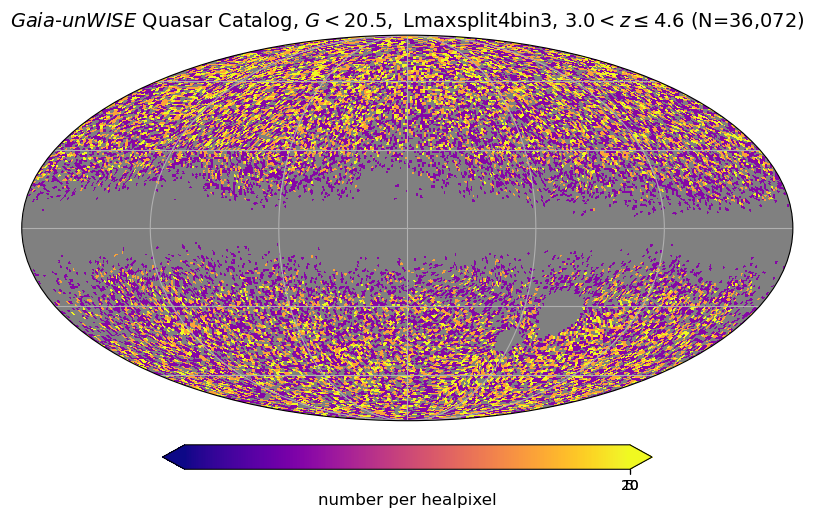

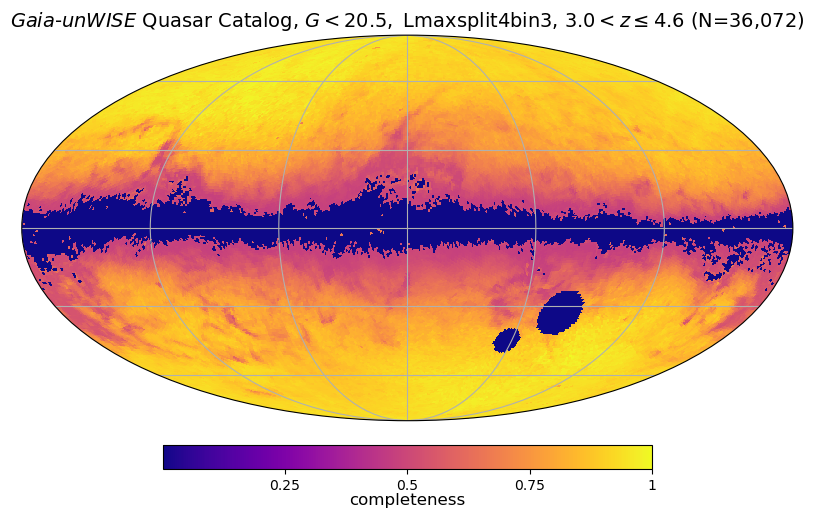

In [234]:
Lsplit = 4
fac_stdev = 0.15
Lmaxsplit = []
for i in range((len(z_bins)-1)):

    Lmax_z = []
    for j in range(Lsplit):
        
        tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, selfunc_hi_bin0, _, _ = quaia.make_bins(G_hi, [i, j], True, ['z', 'L'], 
                                                                                             n_bins = [None, Lsplit], tab_gcat_type = 'data', 
                                                                                              method = ['minmax', 'maxsplit'], fac_rand = fac_rand, 
                                                                                              mask_type = 'b', bins = [z_bins, None])

        N_gcatlo_mask = len(tab_datahi_mask_zbin0)
        pixel_indices_datahi_bin0 = hp.ang2pix(NSIDE, tab_datahi_mask_zbin0['ra'], tab_datahi_mask_zbin0['dec'], lonlat=True)
        map_gcatlo = np.bincount(pixel_indices_datahi_bin0, minlength=NPIX)
        print(np.mean(map_gcatlo)-fac_stdev*np.std(map_gcatlo), np.mean(map_gcatlo)+fac_stdev*np.std(map_gcatlo))
        title_gcatlo = rf"{name_catalog}, $G<{G_hi},$ Lmaxsplit{Lsplit}bin{j}, ${z_bins[j]:.1f}<z \leq{z_bins[j+1]:.1f}$ (N={N_gcatlo_mask:,})"
        projview(map_gcatlo*hp.pixelfunc.nside2pixarea(NSIDE, degrees = True), title=title_gcatlo,
                    unit=r"number per healpixel", cmap=cmap_map, coord=['C','G'],
                    min=np.mean(map_gcatlo)-fac_stdev*np.std(map_gcatlo), max=np.mean(map_gcatlo)+10*fac_stdev*np.std(map_gcatlo), 
                norm='log', graticule=True, cbar_ticks=cbar_ticks, graticule_labels=False) #True

        selfunc_hi_bin0[~selfunc_mask | ~MC_mask] = 0
        
        title_gcatlo = rf"{name_catalog}, $G<{G_hi},$ Lmaxsplit{Lsplit}bin{j}, ${z_bins[j]:.1f}<z \leq{z_bins[j+1]:.1f}$ (N={N_gcatlo_mask:,})"
        projview(selfunc_hi_bin0, title=title_gcatlo,
                    unit=r"completeness", cmap=cmap_map, coord=['C','G'],
                    min=0, max = 1, 
                    graticule=True, cbar_ticks=[0.25, 0.5, 0.75, 1.0], graticule_labels=False) #True

        quaia.absolute(tab_datahi_mask_zbin0, G_hi)
        Lmax_z.append(np.max(tab_datahi_mask_zbin0['M_i']))

    Lmaxsplit.append(Lmax_z)

Pixels masked by MC but not already by selfunc: 908
G20.5_zmin0.0zmax1.0_Lsplit4bin0: 0.01              80176 vs 81084
1.410061347372457 1.8523084442942095
Pixels masked by MC but not already by selfunc: 795
G20.5_zmin0.0zmax1.0_Lsplit4bin1: 0.01              80289 vs 81084
1.3987944372890802 1.8681733361484198
Pixels masked by MC but not already by selfunc: 785
G20.5_zmin0.0zmax1.0_Lsplit4bin2: 0.01              80299 vs 81084
1.3817446226045467 1.8856300518746199
Pixels masked by MC but not already by selfunc: 706
G20.5_zmin0.0zmax1.0_Lsplit4bin3: 0.01              80378 vs 81084
1.3792206545953885 1.891368538112945
Pixels masked by MC but not already by selfunc: 1790
G20.5_zmin1.0zmax2.0_Lsplit4bin0: 0.01              160259 vs 162049
2.900416300616179 3.620539103029654
Pixels masked by MC but not already by selfunc: 1625
G20.5_zmin1.0zmax2.0_Lsplit4bin1: 0.01              160424 vs 162049
2.8761779883869916 3.6514912824463415
Pixels masked by MC but not already by selfunc: 1472
G20

/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/healpy/newvisufunc.py:456: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(


Pixels masked by MC but not already by selfunc: 799
G20.5_zmin2.0zmax3.0_Lsplit4bin3: 0.01              70828 vs 71627
1.1728141075286573 1.7091845903880092
Pixels masked by MC but not already by selfunc: 112
G20.5_zmin3.0zmax4.6_Lsplit4bin0: 0.01              9003 vs 9115
0.11706211658443329 0.24927089122806673
Random catalog is not computed, do not use output
Pixels masked by MC but not already by selfunc: 109
G20.5_zmin3.0zmax4.6_Lsplit4bin1: 0.01              9005 vs 9114
0.11671178321652774 0.24970260480430556
Random catalog is not computed, do not use output
Pixels masked by MC but not already by selfunc: 92
G20.5_zmin3.0zmax4.6_Lsplit4bin2: 0.01              9022 vs 9114
0.11570569963351568 0.251400420158151
Pixels masked by MC but not already by selfunc: 73
G20.5_zmin3.0zmax4.6_Lsplit4bin3: 0.01              9042 vs 9115
0.11363237781178287 0.25428754406321713


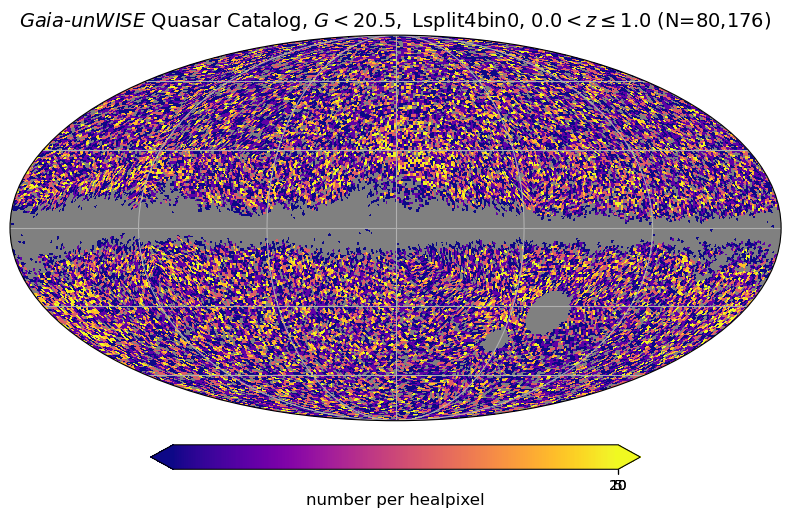

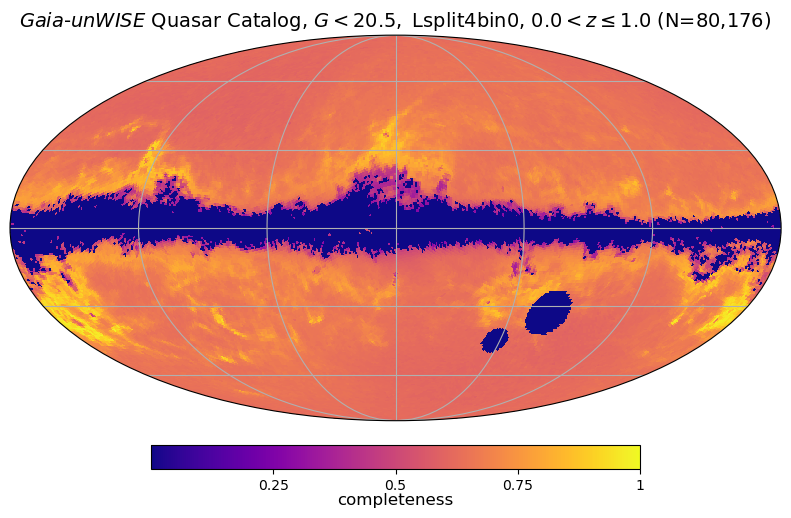

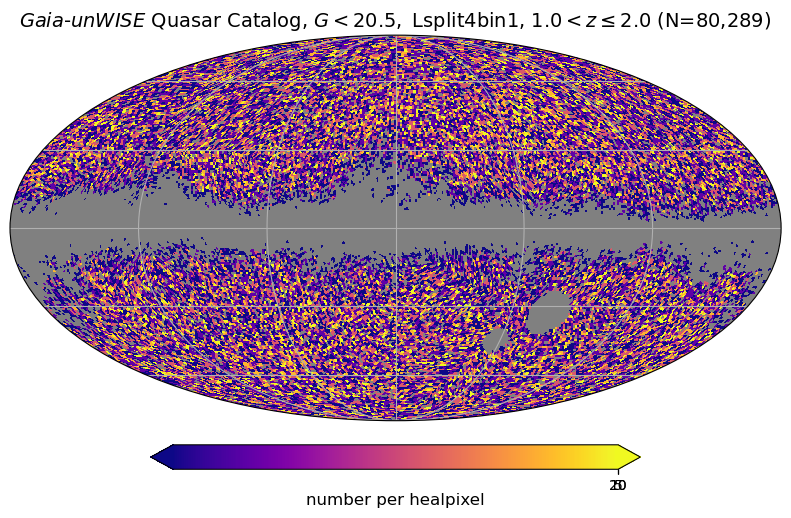

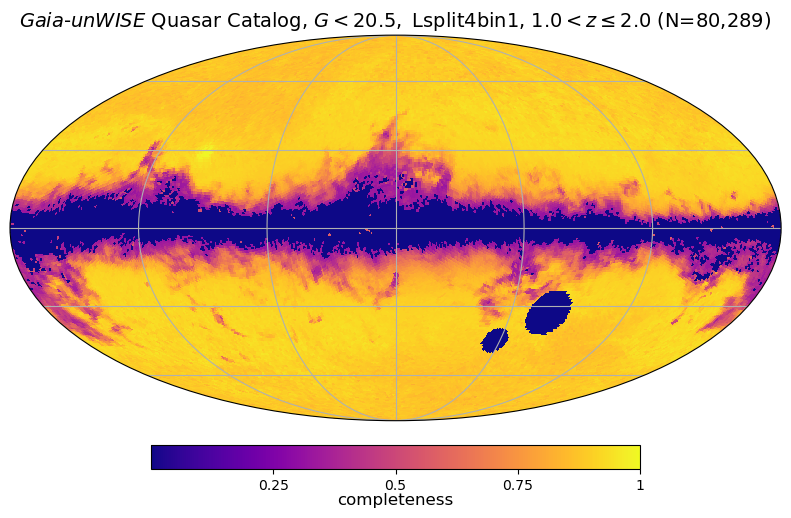

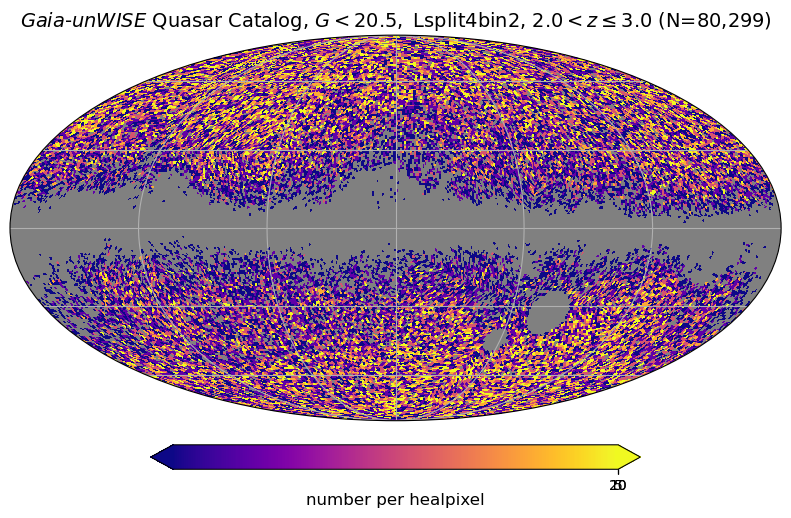

...

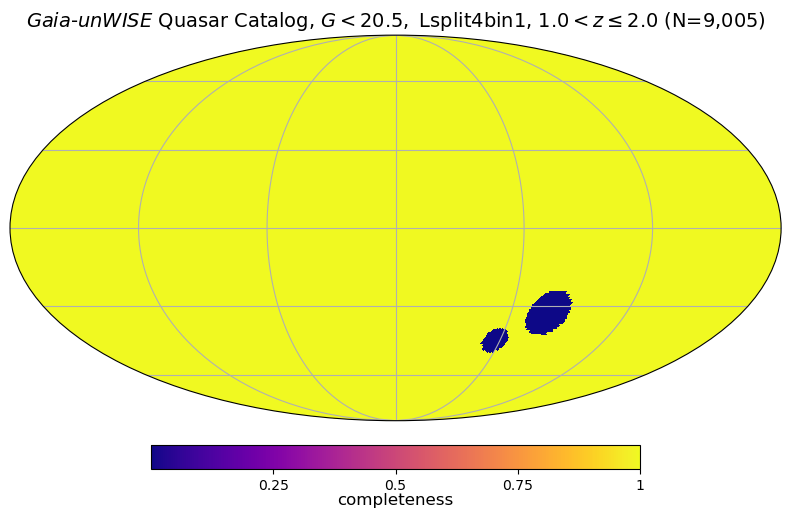

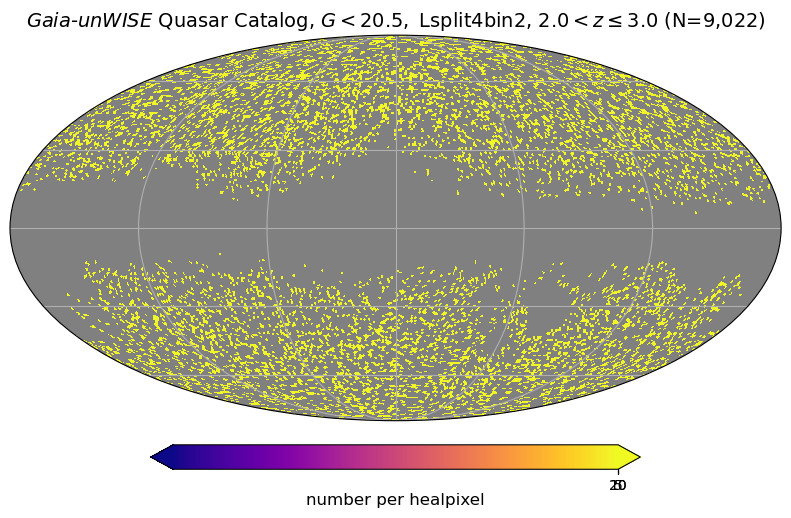

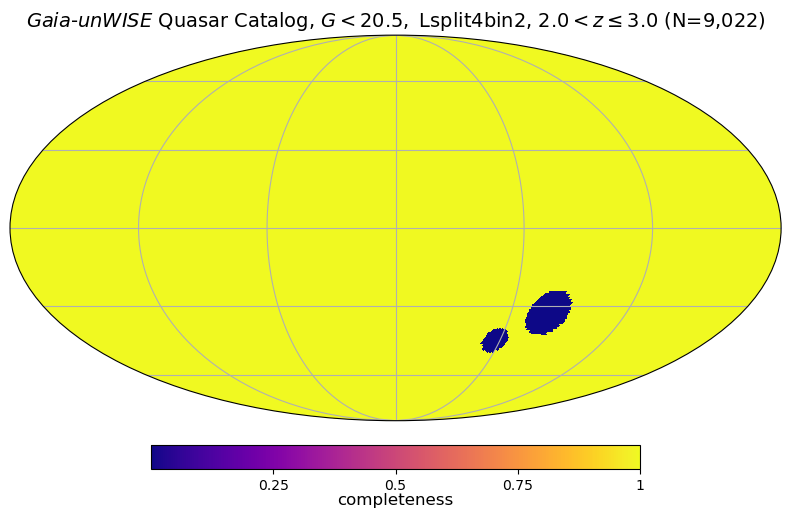

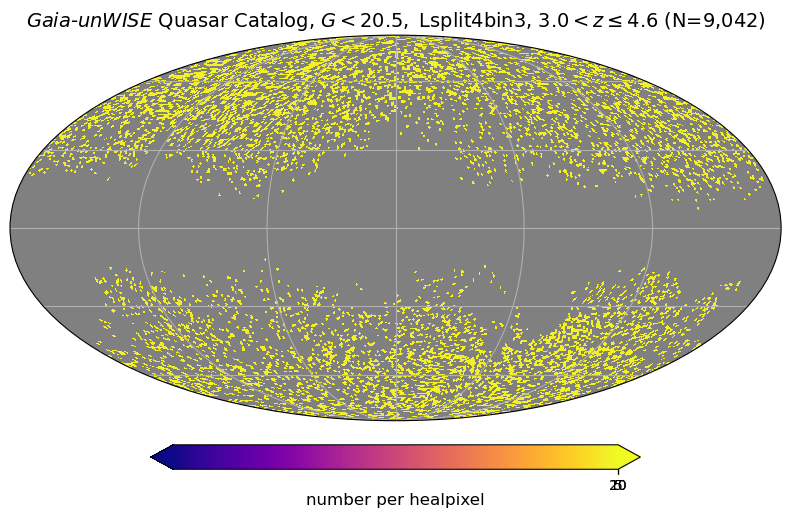

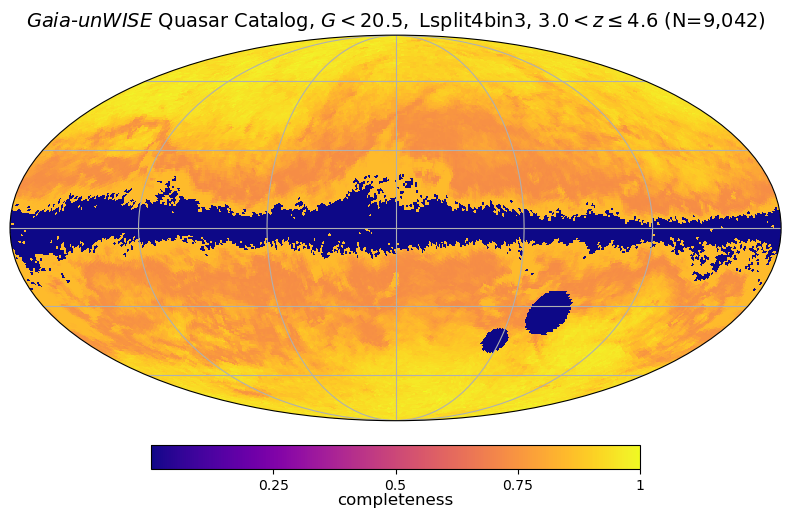

In [235]:
Lsplit = 4
Lmin, Lmax = [], []
for i in range((len(z_bins)-1)):

    Lmin_z, Lmax_z = [], []
    for j in range(Lsplit):
        
        tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, selfunc_hi_bin0, _, _ = quaia.make_bins(G_hi, [i, j], True, ['z', 'L'], 
                                                                                             n_bins = [None, Lsplit], tab_gcat_type = 'data', 
                                                                                              method = ['minmax', 'split'], fac_rand = fac_rand, 
                                                                                              mask_type = 'b', bins = [z_bins, None])

        N_gcatlo_mask = len(tab_datahi_mask_zbin0)
        pixel_indices_datahi_bin0 = hp.ang2pix(NSIDE, tab_datahi_mask_zbin0['ra'], tab_datahi_mask_zbin0['dec'], lonlat=True)
        map_gcatlo = np.bincount(pixel_indices_datahi_bin0, minlength=NPIX)
        print(np.mean(map_gcatlo)-fac_stdev*np.std(map_gcatlo), np.mean(map_gcatlo)+fac_stdev*np.std(map_gcatlo))
        title_gcatlo = rf"{name_catalog}, $G<{G_hi},$ Lsplit{Lsplit}bin{j}, ${z_bins[j]:.1f}<z \leq{z_bins[j+1]:.1f}$ (N={N_gcatlo_mask:,})"
        projview(map_gcatlo*hp.pixelfunc.nside2pixarea(NSIDE, degrees = True), title=title_gcatlo,
                    unit=r"number per healpixel", cmap=cmap_map, coord=['C','G'],
                    min=np.mean(map_gcatlo)-fac_stdev*np.std(map_gcatlo), max=np.mean(map_gcatlo)+10*fac_stdev*np.std(map_gcatlo), 
                norm='log', graticule=True, cbar_ticks=cbar_ticks, graticule_labels=False) #True

        selfunc_hi_bin0[~selfunc_mask | ~MC_mask] = 0
        
        title_gcatlo = rf"{name_catalog}, $G<{G_hi},$ Lsplit{Lsplit}bin{j}, ${z_bins[j]:.1f}<z \leq{z_bins[j+1]:.1f}$ (N={N_gcatlo_mask:,})"
        projview(selfunc_hi_bin0, title=title_gcatlo,
                    unit=r"completeness", cmap=cmap_map, coord=['C','G'],
                    min=0, max = 1, 
                    graticule=True, cbar_ticks=[0.25, 0.5, 0.75, 1.0], graticule_labels=False) #True

        quaia.absolute(tab_datahi_mask_zbin0, G_hi)
        Lmin_z.append(np.min(tab_datahi_mask_zbin0['M_i']))
        Lmax_z.append(np.max(tab_datahi_mask_zbin0['M_i']))

    Lmin.append(Lmin_z)
    Lmax.append(Lmax_z)

# Plot clustering
## Threshold

In [16]:
cmap_theta = sns.color_palette("cubehelix", n_colors = len(L_bins))
cmap_theta

[(0.08605633600581403, 0.23824692404212, 0.30561236308077167),
 (0.32927729263408284, 0.4762845556584382, 0.1837155549758328),
 (0.8146245329198283, 0.49548316572322215, 0.5752525936416857),
 (0.7587183008012618, 0.7922069335474338, 0.9543861221913403)]

In [17]:
# Create the bins array
rmin = 0.001
rmax = 10.0
nbins = 30 #20 #30 #20
thetabins = np.logspace(np.log10(rmin), np.log10(rmax), nbins+1)
np.log10(thetabins), quaia.recenter(np.log10(thetabins)), np.diff(np.log10(thetabins))

(array([-3.        , -2.86666667, -2.73333333, -2.6       , -2.46666667,
        -2.33333333, -2.2       , -2.06666667, -1.93333333, -1.8       ,
        -1.66666667, -1.53333333, -1.4       , -1.26666667, -1.13333333,
        -1.        , -0.86666667, -0.73333333, -0.6       , -0.46666667,
        -0.33333333, -0.2       , -0.06666667,  0.06666667,  0.2       ,
         0.33333333,  0.46666667,  0.6       ,  0.73333333,  0.86666667,
         1.        ]),
 array([-2.93333333e+00, -2.80000000e+00, -2.66666667e+00, -2.53333333e+00,
        -2.40000000e+00, -2.26666667e+00, -2.13333333e+00, -2.00000000e+00,
        -1.86666667e+00, -1.73333333e+00, -1.60000000e+00, -1.46666667e+00,
        -1.33333333e+00, -1.20000000e+00, -1.06666667e+00, -9.33333333e-01,
        -8.00000000e-01, -6.66666667e-01, -5.33333333e-01, -4.00000000e-01,
        -2.66666667e-01, -1.33333333e-01, -2.35922393e-16,  1.33333333e-01,
         2.66666667e-01,  4.00000000e-01,  5.33333333e-01,  6.66666667e-01,
       

In [42]:
N=50
cosmo = 'Planck'
b=30

In [43]:
delta_xlim = np.diff(np.log10(thetabins))[0]/2
delta_xlim/2, thetabins, 10**(np.log10(thetabins) - 2*delta_xlim)

(0.033333333333333326,
 array([1.00000000e-03, 1.35935639e-03, 1.84784980e-03, 2.51188643e-03,
        3.41454887e-03, 4.64158883e-03, 6.30957344e-03, 8.57695899e-03,
        1.16591440e-02, 1.58489319e-02, 2.15443469e-02, 2.92864456e-02,
        3.98107171e-02, 5.41169527e-02, 7.35642254e-02, 1.00000000e-01,
        1.35935639e-01, 1.84784980e-01, 2.51188643e-01, 3.41454887e-01,
        4.64158883e-01, 6.30957344e-01, 8.57695899e-01, 1.16591440e+00,
        1.58489319e+00, 2.15443469e+00, 2.92864456e+00, 3.98107171e+00,
        5.41169527e+00, 7.35642254e+00, 1.00000000e+01]),
 array([7.35642254e-04, 1.00000000e-03, 1.35935639e-03, 1.84784980e-03,
        2.51188643e-03, 3.41454887e-03, 4.64158883e-03, 6.30957344e-03,
        8.57695899e-03, 1.16591440e-02, 1.58489319e-02, 2.15443469e-02,
        2.92864456e-02, 3.98107171e-02, 5.41169527e-02, 7.35642254e-02,
        1.00000000e-01, 1.35935639e-01, 1.84784980e-01, 2.51188643e-01,
        3.41454887e-01, 4.64158883e-01, 6.30957344e-01,

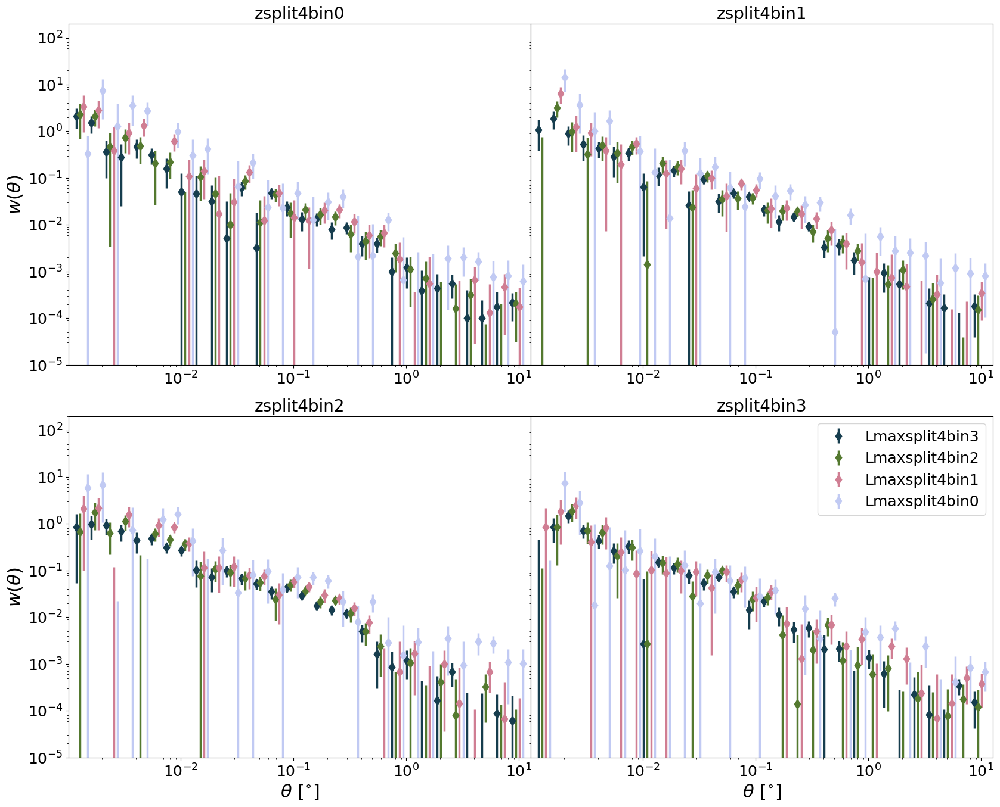

In [182]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit=4
Lsplit=4
b=30

# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        # if (((i<3) and (N_q[i][j]>N_q[i][j])) or (i==3)) and (np.round(N_q[i][j]/1000)>1):

        sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lmaxsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, N, cosmo, b))))
        wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, cosmo, b))
        a = float(np.load('../results/a_G{}_zsplit{}bin{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, zsplit, j, Lsplit, i, cosmo, b)))            
        
        ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', color = cmap_theta[::-1][i],
                    yerr = sigma, markeredgewidth = 2.5, linestyle = 'none', label = 'Lmaxsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5

        ax1.set_title('zsplit{}bin{}'.format(zsplit, j))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j > 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
            
ax1.legend(loc = 'upper right')

plt.show()

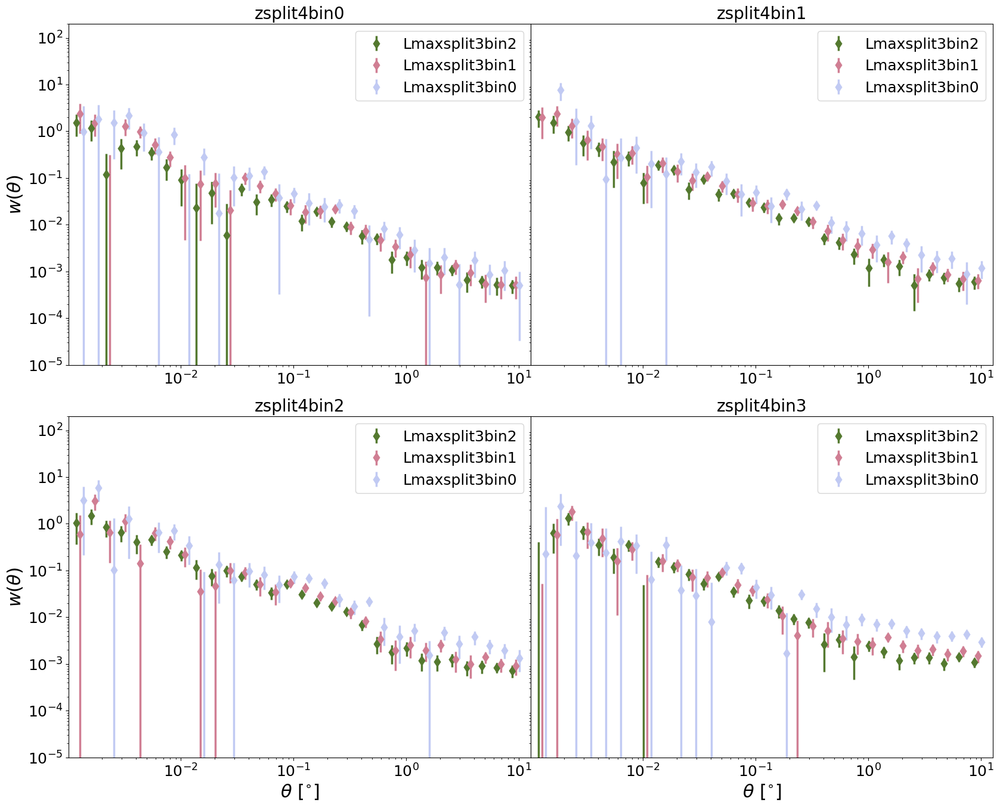

In [185]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit = 4
Lsplit = 3
b=10
# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lmaxsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, N, cosmo, b))))
        wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, cosmo, b))
        a = float(np.load('../results/a_G{}_zsplit{}bin{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, zsplit, j, Lsplit, i, cosmo, b)))            
        
        ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', 
                     color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none',
                     label = 'Lmaxsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5

        ax1.set_title('zsplit{}bin{}'.format(zsplit, j))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j > 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
        ax1.legend(loc = 'upper right')

plt.show()

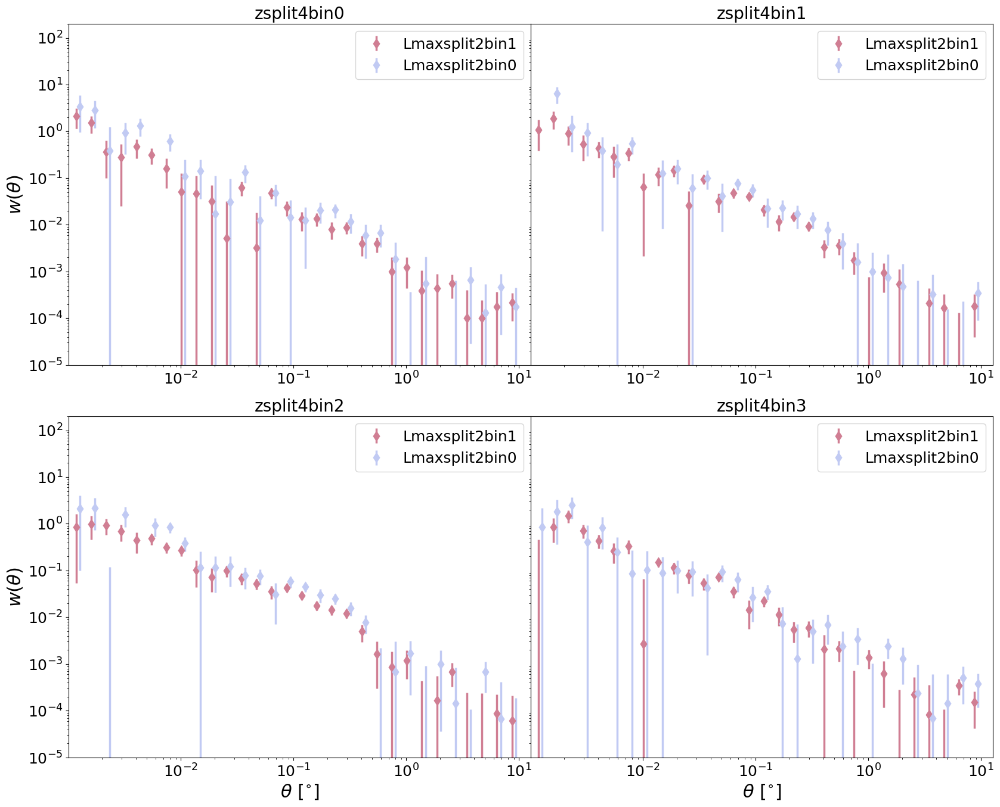

In [186]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit = 4
Lsplit = 2
b=30
# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lmaxsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, N, cosmo, b))))
        wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, cosmo, b))
        a = float(np.load('../results/a_G{}_zsplit{}bin{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, zsplit, j, Lsplit, i, cosmo, b)))            
        
        ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', 
                     color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none',
                     label = 'Lmaxsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5

        ax1.set_title('zsplit{}bin{}'.format(zsplit, j))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j > 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
        ax1.legend(loc = 'upper right')

plt.show()

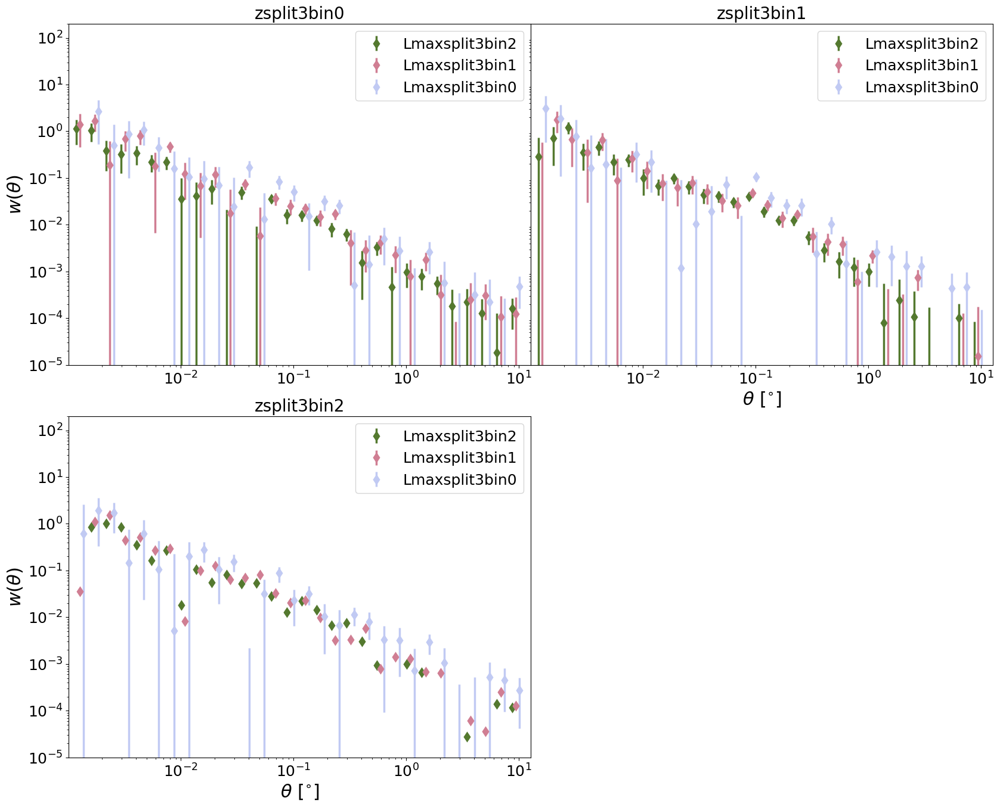

In [202]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit = 3
Lsplit = 3
b=30
# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        try:
            
            sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lmaxsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
                G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, N, cosmo, b))))
        except Exception as e:
            sigma = 0
            
        wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, cosmo, b))
        a = float(np.load('../results/a_G{}_zsplit{}bin{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, zsplit, j, Lsplit, i, cosmo, b)))            
        
        ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', 
                     color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none', 
                     label = 'Lmaxsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5

        # except Exception as e:
        #     print(e)

        ax1.set_title('zsplit{}bin{}'.format(zsplit, j))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j >= 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
        ax1.legend(loc = 'upper right')

plt.show()

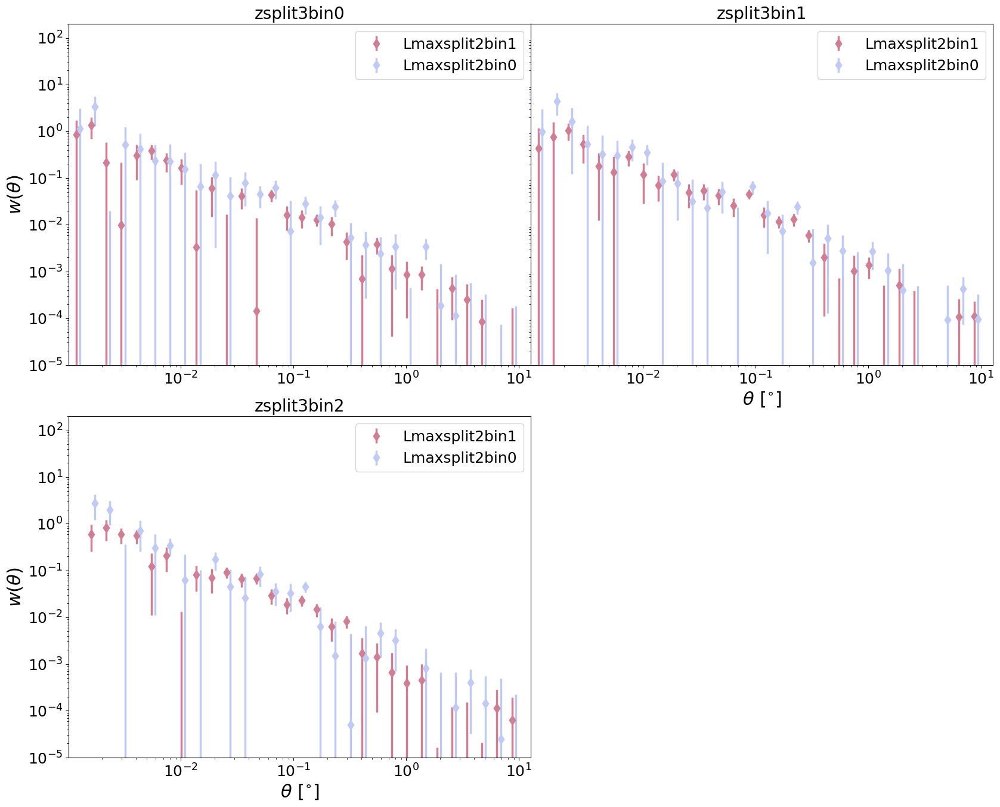

In [188]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit = 3
Lsplit = 2
b=50
# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lmaxsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, N, cosmo, b))))
        wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, cosmo, b))
        a = float(np.load('../results/a_G{}_zsplit{}bin{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, zsplit, j, Lsplit, i, cosmo, b)))            
        
        ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd',
                     color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none', 
                     label = 'Lmaxsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5

        ax1.set_title('zsplit{}bin{}'.format(zsplit, j))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j >= 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
        ax1.legend(loc = 'upper right')

plt.show()

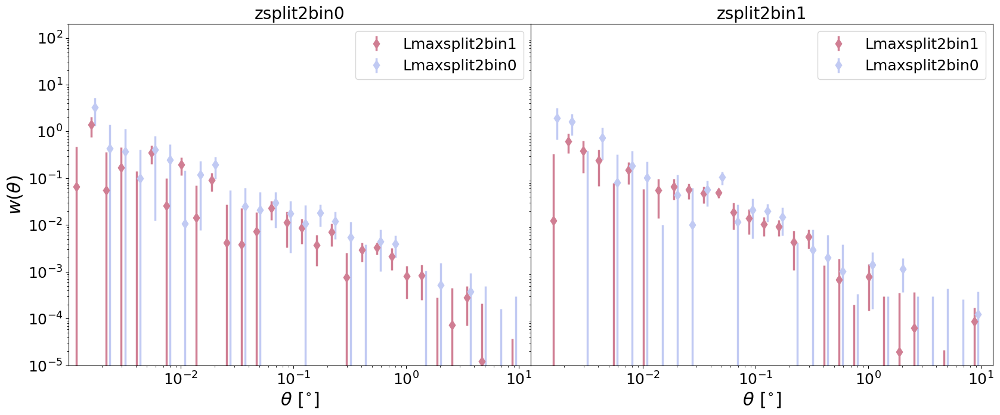

In [189]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit = 2
Lsplit = 2
b=60
# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lmaxsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, N, cosmo, b))))
        wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, cosmo, b))
        a = float(np.load('../results/a_G{}_zsplit{}bin{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, zsplit, j, Lsplit, i, cosmo, b)))            
        
        ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', 
                     color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none', 
                     label = 'Lmaxsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5

        ax1.set_title('zsplit{}bin{}'.format(zsplit, j))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        # if j > 1:
        ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
        ax1.legend(loc = 'upper right')

plt.show()

<>:25: SyntaxWarning: invalid escape sequence '\l'
<>:29: SyntaxWarning: invalid escape sequence '\l'
<>:25: SyntaxWarning: invalid escape sequence '\l'
<>:29: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_22359/3555678401.py:25: SyntaxWarning: invalid escape sequence '\l'
  yerr = sigma, markeredgewidth = 2.5, linestyle = 'none', label = '$M_i\leq{:.1f}$'.format(Lmaxsplit[j][i]) )#label = '$M_i\leq{:.1f}$ ({}%)'.format(Lmaxsplit[j][i], percent[i])) #label = 'Lmaxsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5
/tmp/ipykernel_22359/3555678401.py:29: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]))


0 3
1 2
2 1
3 0
0 3
1 2
2 1
3 0
0 3
1 2
2 1
3 0


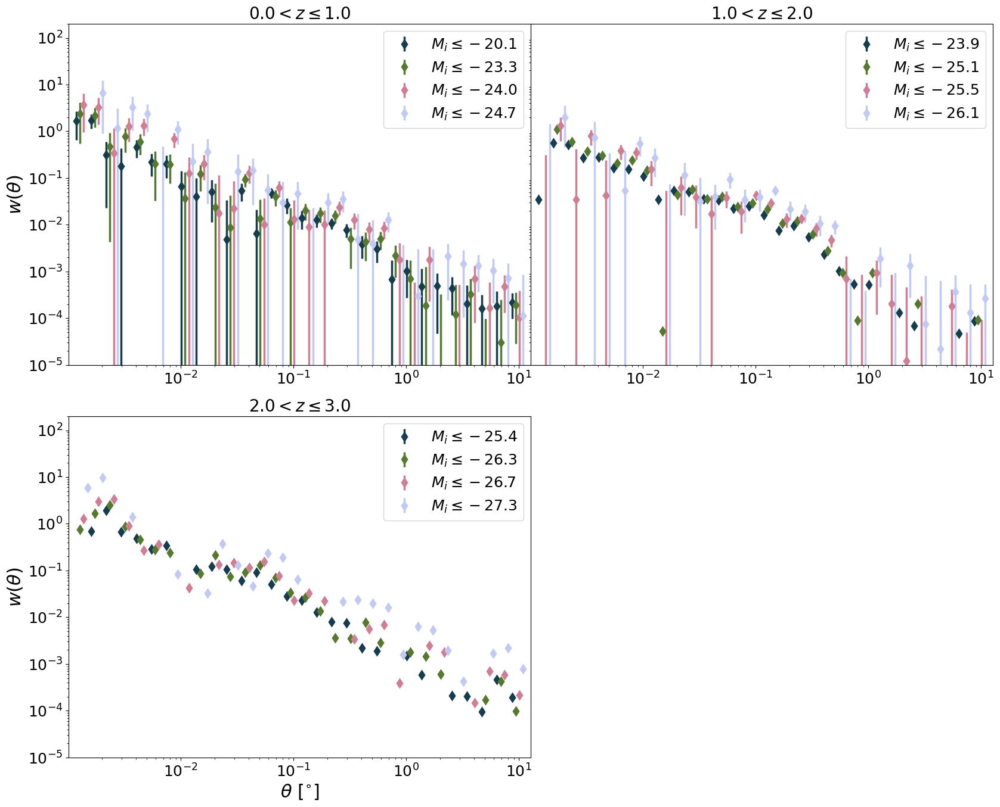

In [251]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
Lsplit=4
b=30
percent = [25, 50, 75, 100]
# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        try:
            sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zmin{}zmax{}_Lmaxsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
                G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], Lsplit, i, N, cosmo, b))))
        except Exception as e:
            sigma = 0
            
        wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zmin{}zmax{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], Lsplit, i, cosmo, b))
        a = float(np.load('../results/a_G{}_zmin{}zmax{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, z_bins[j], z_bins[j+1], Lsplit, i, cosmo, b)))            
        print(k,i)
        ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', color = cmap_theta[::-1][i],
                    yerr = sigma, markeredgewidth = 2.5, linestyle = 'none', label = '$M_i\leq{:.1f}$'.format(Lmaxsplit[j][i]))#label = '$M_i\leq{:.1f}$ ({}%)'.format(Lmaxsplit[j][i], percent[i])) #label = 'Lmaxsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5
        # except Exception as e:
        #     print(e)

        ax1.set_title('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j > 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
            
        ax1.legend(loc = 'upper right')#, title = '25th percentiles', title_fontsize = 20)

plt.show()

<>:28: SyntaxWarning: invalid escape sequence '\l'
<>:28: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_22359/3471572490.py:28: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]))


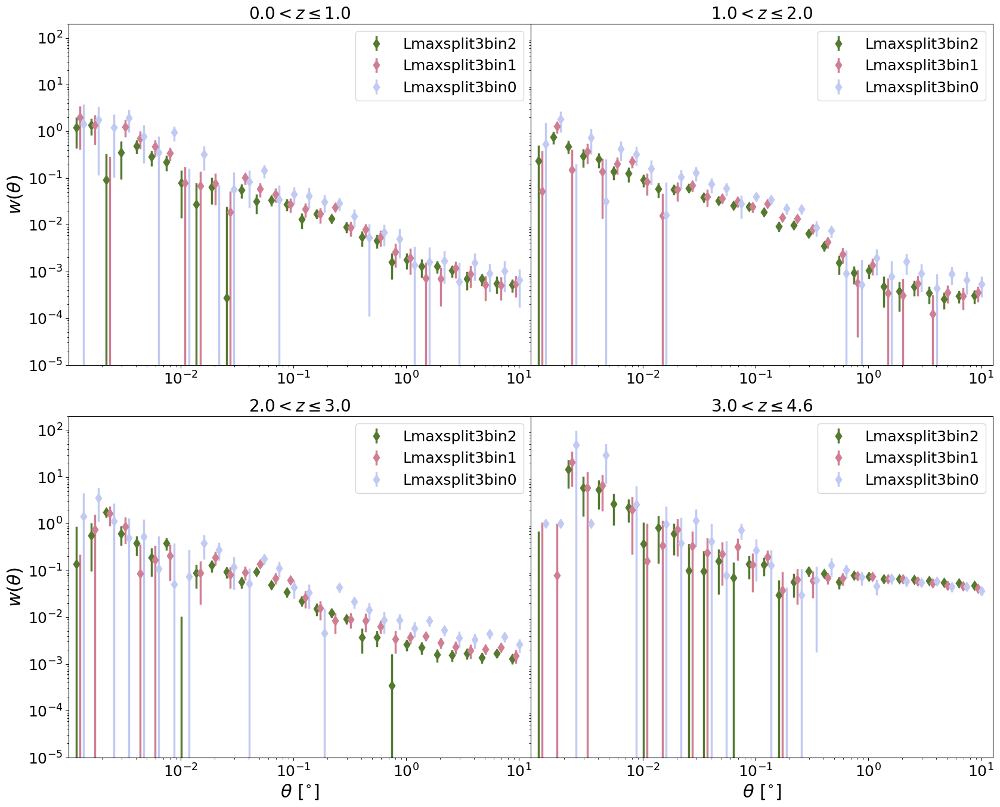

In [190]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit=4
Lsplit=3
b=10

# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        try:
            sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zmin{}zmax{}_Lmaxsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
                G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], Lsplit, i, N, cosmo, b))))
            wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zmin{}zmax{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(
                G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], Lsplit, i, cosmo, b))
            a = float(np.load('../results/a_G{}_zmin{}zmax{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, z_bins[j], z_bins[j+1], Lsplit, i, cosmo, b)))            
            
            ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', 
                         color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none', 
                         label = 'Lmaxsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5
        except Exception as e:
            print(e)

        ax1.set_title('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j > 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
            
        ax1.legend(loc = 'upper right')

plt.show()

<>:28: SyntaxWarning: invalid escape sequence '\l'
<>:28: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_22359/3938187469.py:28: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]))


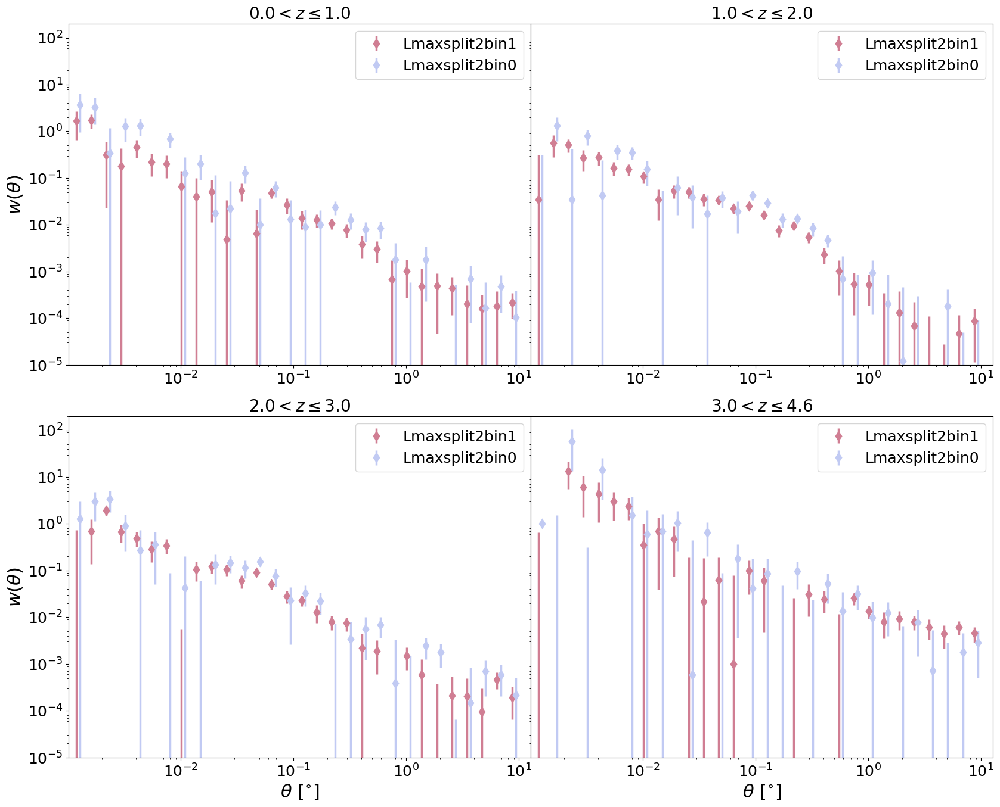

In [191]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit=4
Lsplit=2
b=30

# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        try:
            sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zmin{}zmax{}_Lmaxsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
                G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], Lsplit, i, N, cosmo, b))))
            wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zmin{}zmax{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(
                G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], Lsplit, i, cosmo, b))
            a = float(np.load('../results/a_G{}_zmin{}zmax{}_Lmaxsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, z_bins[j], z_bins[j+1], Lsplit, i, cosmo, b)))            
            
            ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', 
                         color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none', 
                         label = 'Lmaxsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5
        except Exception as e:
            print(e)

        ax1.set_title('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j > 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
            
        ax1.legend(loc = 'upper right')

plt.show()

## Bins

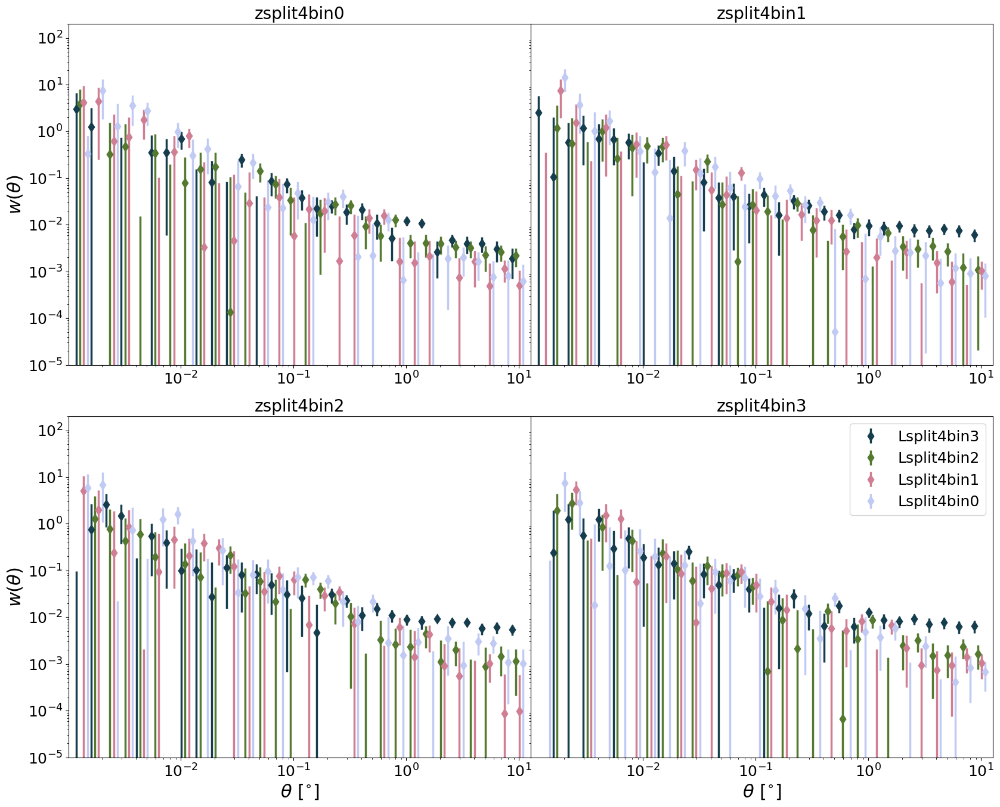

In [192]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit=4
Lsplit=4
b=30

# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        # if (((i<3) and (N_q[i][j]>N_q[i][j])) or (i==3)) and (np.round(N_q[i][j]/1000)>1):

        sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, N, cosmo, b))))
        wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, cosmo, b))
        a = float(np.load('../results/a_G{}_zsplit{}bin{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, zsplit, j, Lsplit, i, cosmo, b)))            
        
        ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', 
                     color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none', 
                     label = 'Lsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5

        ax1.set_title('zsplit{}bin{}'.format(zsplit, j))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j > 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
            
ax1.legend(loc = 'upper right')

plt.show()

/tmp/ipykernel_22359/2920160014.py:26: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax1.set_yscale('log')


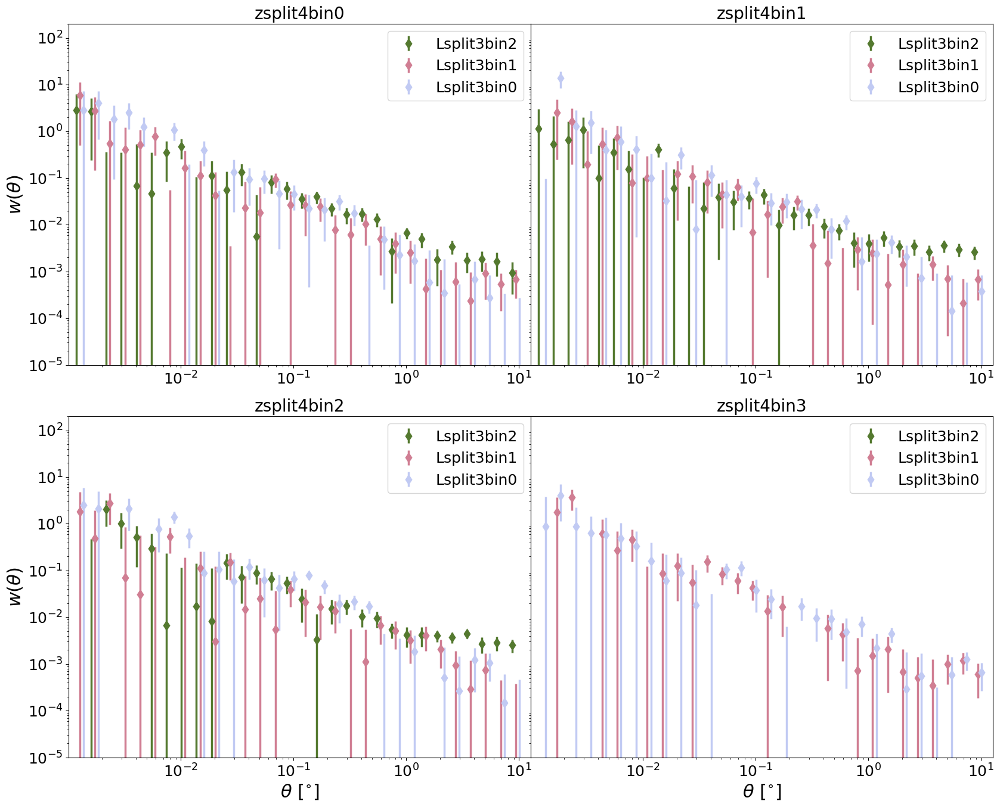

In [193]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit = 4
Lsplit = 3
b=30
# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, N, cosmo, b))))
        wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, cosmo, b))
        a = float(np.load('../results/a_G{}_zsplit{}bin{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, zsplit, j, Lsplit, i, cosmo, b)))            
        
        ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', 
                     color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none',
                     label = 'Lsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5

        ax1.set_title('zsplit{}bin{}'.format(zsplit, j))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j > 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
        ax1.legend(loc = 'upper right')

plt.show()

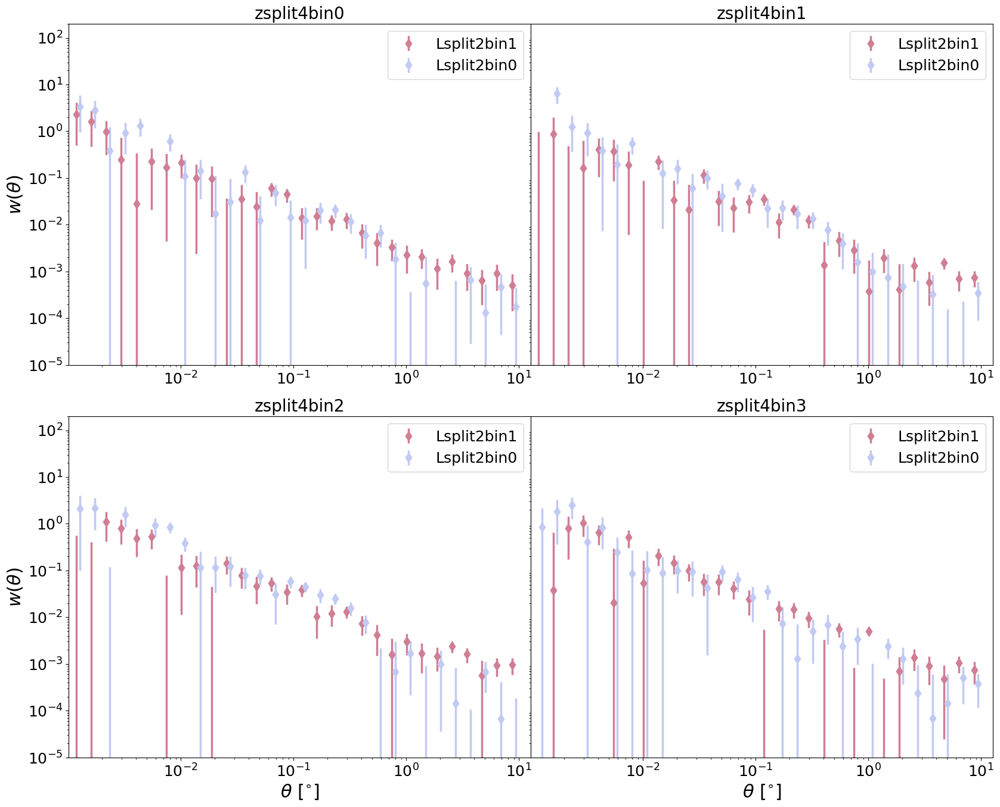

In [194]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit = 4
Lsplit = 2
# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, N, cosmo, b))))
        wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, cosmo, b))
        a = float(np.load('../results/a_G{}_zsplit{}bin{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, zsplit, j, Lsplit, i, cosmo, b)))            
        
        ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd',
                     color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none', 
                     label = 'Lsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5

        ax1.set_title('zsplit{}bin{}'.format(zsplit, j))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j > 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
        ax1.legend(loc = 'upper right')

plt.show()

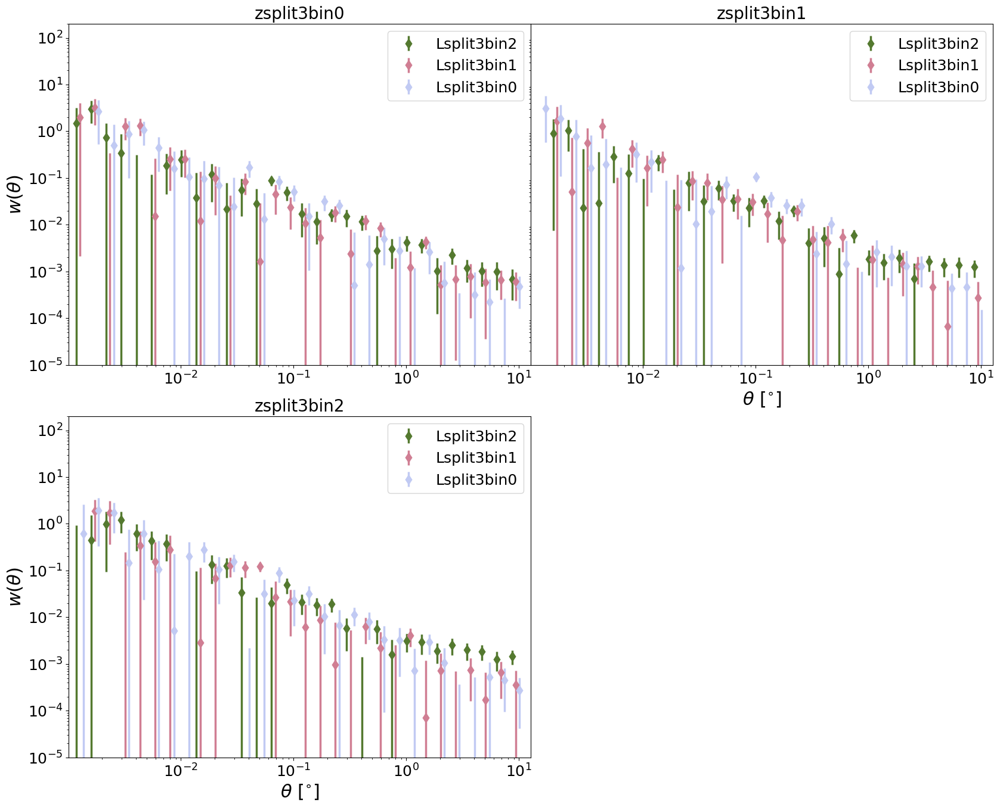

In [195]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit = 3
Lsplit = 3
b=30
# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, N, cosmo, b))))
        wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, cosmo, b))
        a = float(np.load('../results/a_G{}_zsplit{}bin{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, zsplit, j, Lsplit, i, cosmo, b)))            
        
        ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', 
                     color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none', 
                     label = 'Lsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5

        ax1.set_title('zsplit{}bin{}'.format(zsplit, j))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j >= 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
        ax1.legend(loc = 'upper right')

plt.show()

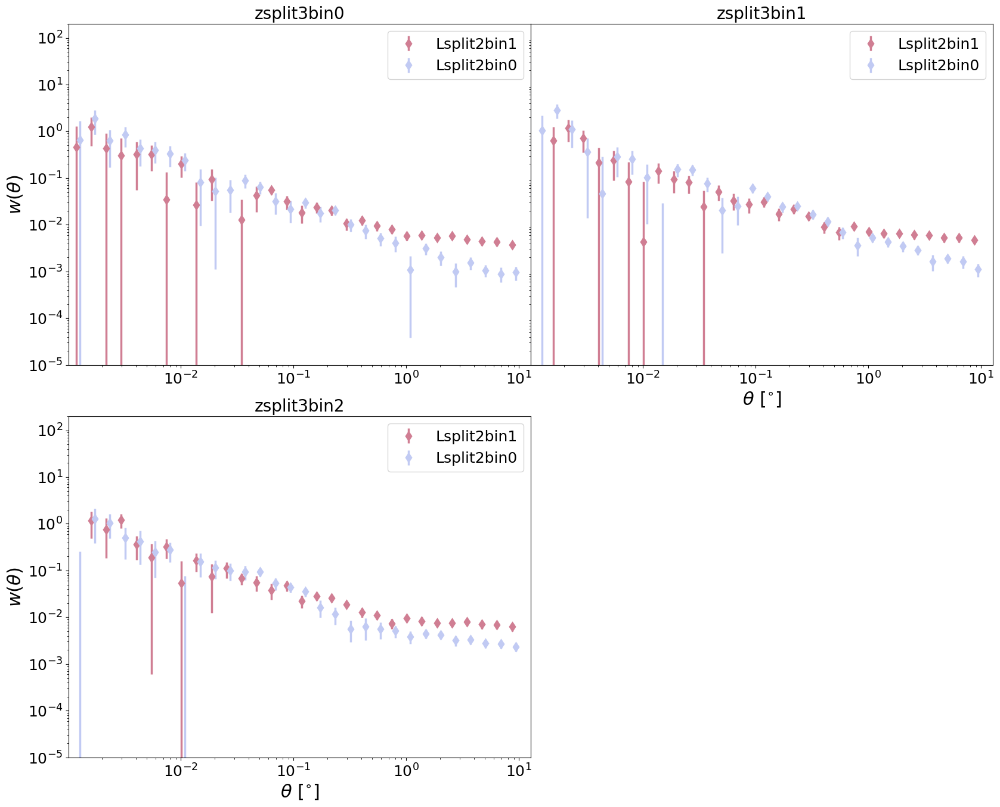

In [196]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit = 3
Lsplit = 2
b=0
# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, N, cosmo, b))))
        wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, cosmo, b))
        a = float(np.load('../results/a_G{}_zsplit{}bin{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, zsplit, j, Lsplit, i, cosmo, b)))            
        
        ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', 
                     color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none',
                     label = 'Lsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5

        ax1.set_title('zsplit{}bin{}'.format(zsplit, j))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j >= 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
        ax1.legend(loc = 'upper right')

plt.show()

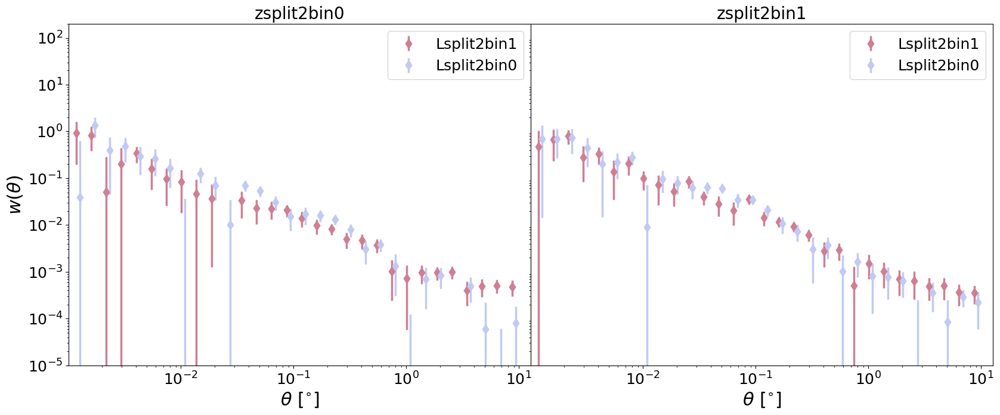

In [197]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit = 2
Lsplit = 2
b=20
# remove bottom panel and just print bq somewhere
# plot!
for j in range(zsplit):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, N, cosmo, b))))
        wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zsplit{}bin{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(
            G_hi, rmin, rmax, nbins, zsplit, j, Lsplit, i, cosmo, b))
        a = float(np.load('../results/a_G{}_zsplit{}bin{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, zsplit, j, Lsplit, i, cosmo, b)))            
        
        ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', 
                     color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none', 
                     label = 'Lsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5

        ax1.set_title('zsplit{}bin{}'.format(zsplit, j))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        # if j > 1:
        ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
        ax1.legend(loc = 'upper right')

plt.show()

<>:26: SyntaxWarning: invalid escape sequence '\l'
<>:26: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_22359/3807553204.py:26: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]))


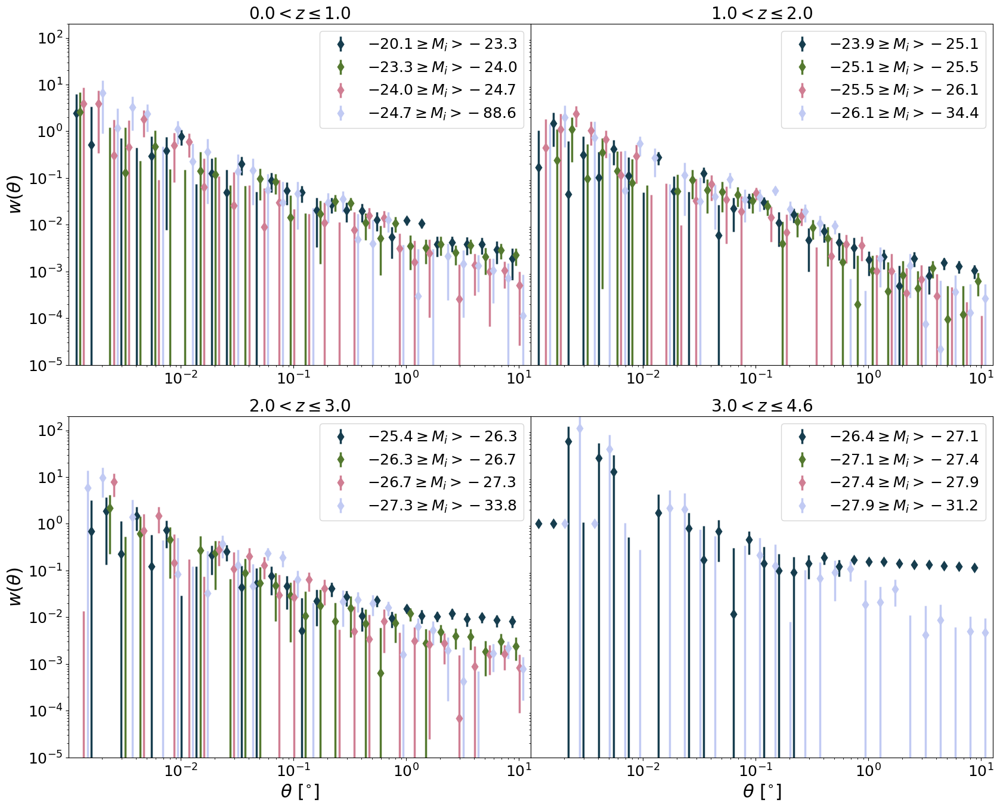

In [249]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
Lsplit=4
b=30

# remove bottom panel and just print bq somewhere
# plot!
for j in range(len(z_bins)-1):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        try:
            sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zmin{}zmax{}_Lsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
                G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], Lsplit, i, N, cosmo, b))))
            wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zmin{}zmax{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(
                G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], Lsplit, i, cosmo, b))
            a = float(np.load('../results/a_G{}_zmin{}zmax{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, z_bins[j], z_bins[j+1], Lsplit, i, cosmo, b)))            
            
            ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', color = cmap_theta[::-1][i],
                        yerr = sigma, markeredgewidth = 2.5, linestyle = 'none', label = r'${:.1f}\geq M_i>{:.1f}$'.format(Lmax[j][i], Lmin[j][i])) #label = 'Lsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5
        except Exception as e:
            print(e)

        ax1.set_title('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j > 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
            
        ax1.legend(loc = 'upper right')

plt.show()

<>:28: SyntaxWarning: invalid escape sequence '\l'
<>:28: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_22359/3895055889.py:28: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]))


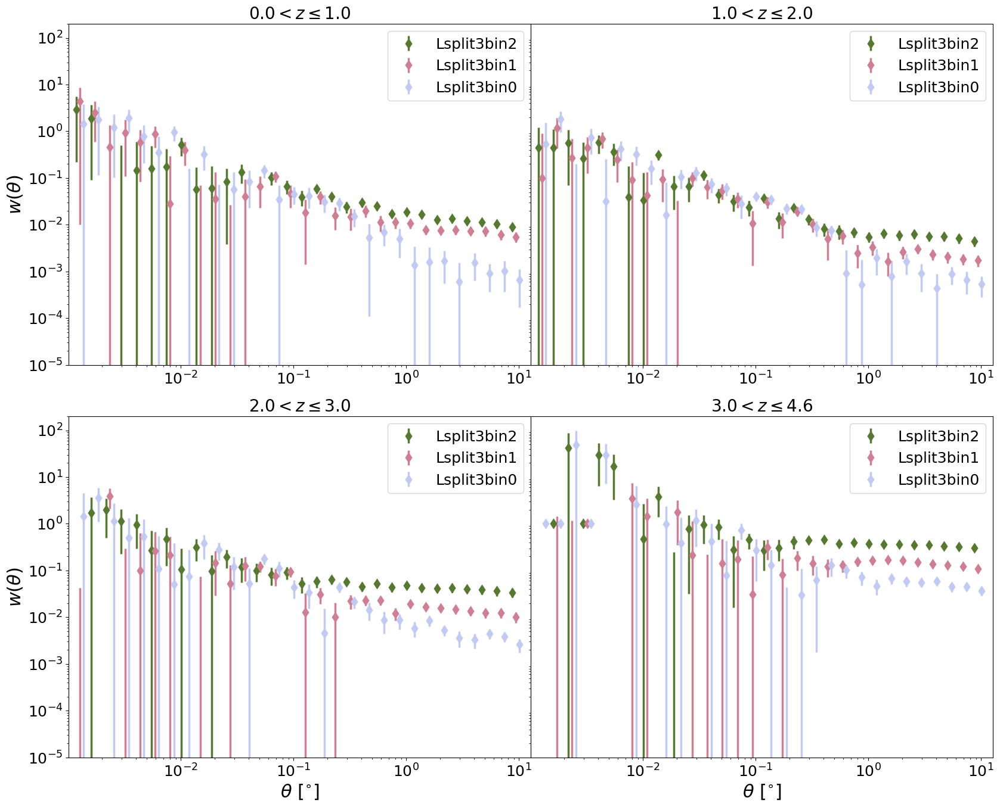

In [198]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
zsplit=4
Lsplit=3
b=10

# remove bottom panel and just print bq somewhere
# plot!
for j in range(len(z_bins)-1):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        try:
            sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zmin{}zmax{}_Lsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
                G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], Lsplit, i, N, cosmo, b))))
            wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zmin{}zmax{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(
                G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], Lsplit, i, cosmo, b))
            a = float(np.load('../results/a_G{}_zmin{}zmax{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, z_bins[j], z_bins[j+1], Lsplit, i, cosmo, b)))            
            
            ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', 
                         color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none', 
                         label = 'Lsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5
        except Exception as e:
            print(e)

        ax1.set_title('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j > 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
            
        ax1.legend(loc = 'upper right')

plt.show()

<>:28: SyntaxWarning: invalid escape sequence '\l'
<>:28: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_22359/3295463435.py:28: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]))


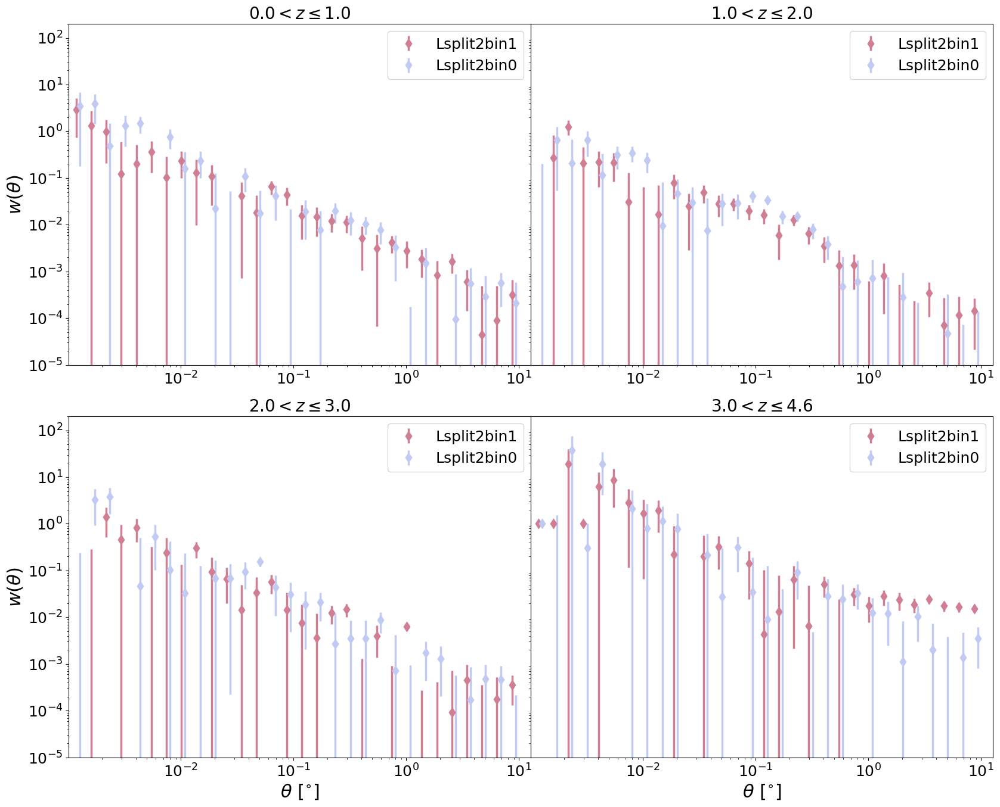

In [199]:
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, wspace = 0, hspace = 0.15)
# zsplit=4
Lsplit=2
b=40

# remove bottom panel and just print bq somewhere
# plot!
for j in range(len(z_bins)-1):

    ax1 = fig.add_subplot(gs[j])

    for k, i in enumerate(reversed(range(Lsplit))):

        try:
            sigma = np.sqrt(np.diag(np.load('../results/cov_wtheta_G{}_rmin{}_rmax{}_nbins{}_zmin{}zmax{}_Lsplit{}bin{}_N{}_{}_MC_b{}.npy'.format(
                G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], Lsplit, i, N, cosmo, b))))
            wp_zbin_i = np.load('../results/wtheta_G{}_rmin{}_rmax{}_nbins{}_zmin{}zmax{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(
                G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], Lsplit, i, cosmo, b))
            # a = float(np.load('../results/a_G{}_zmin{}zmax{}_Lsplit{}bin{}_{}_MC_b{}.npy'.format(G_hi, z_bins[j], z_bins[j+1], Lsplit, i, cosmo, b)))            
            
            ax1.errorbar(10**(np.log10(quaia.recenter(thetabins)) + k*delta_xlim/2), wp_zbin_i, linewidth = 2.5, marker = 'd', 
                         color = cmap_theta[::-1][i], yerr = sigma, markeredgewidth = 2.5, linestyle = 'none',
                         label = 'Lsplit{}bin{}'.format(Lsplit, i)) #capsize = 2.5
        except Exception as e:
            print(e)

        ax1.set_title('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]))
        ax1.set_xlim(10**(np.log10(quaia.recenter(thetabins))[0] - delta_xlim), 10**(np.log10(quaia.recenter(thetabins))[-1] + 5/2*delta_xlim))
        ax1.set_yscale('log')
        ax1.set_xscale('log')
        ax1.set_ylim(1e-5, 2e2)
        
        if j%2==0:
            ax1.set_ylabel(r"$w(\theta)$")
        else:
            ax1.set_yticks([])
        if j > 1:
            ax1.set_xlabel(r'$\theta$ $[^{\circ}]$') 
            
        ax1.legend(loc = 'upper right')

plt.show()